In [1]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Ellipse

import pandas as pd
import numpy as np
import os
import xarray as xr

import astropy.units as au
import astropy.constants as ac

import sys

sys.path.insert(0, "../python/")

from fitting_scripts import (
    fit_odr,
    scifmt,
    labels,
    plot_fitting_mean,
    get_model_odr,
    add_panel_labels,
)  # noqa: E402

In [2]:
plt.style.use("ncr-paper.mplstyle")

In [3]:
outdir = "../lowZ-figures-paper"
os.makedirs(outdir, exist_ok=True)

/Users/ckim/miniconda3/envs/prfm/lib/python3.11/site-packages/pandas/core/internals/blocks.py:329: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)
/Users/ckim/miniconda3/envs/prfm/lib/python3.11/site-packages/pandas/core/internals/blocks.py:329: RuntimeWarning: invalid value encountered in log10
  result = func(self.values, **kwargs)


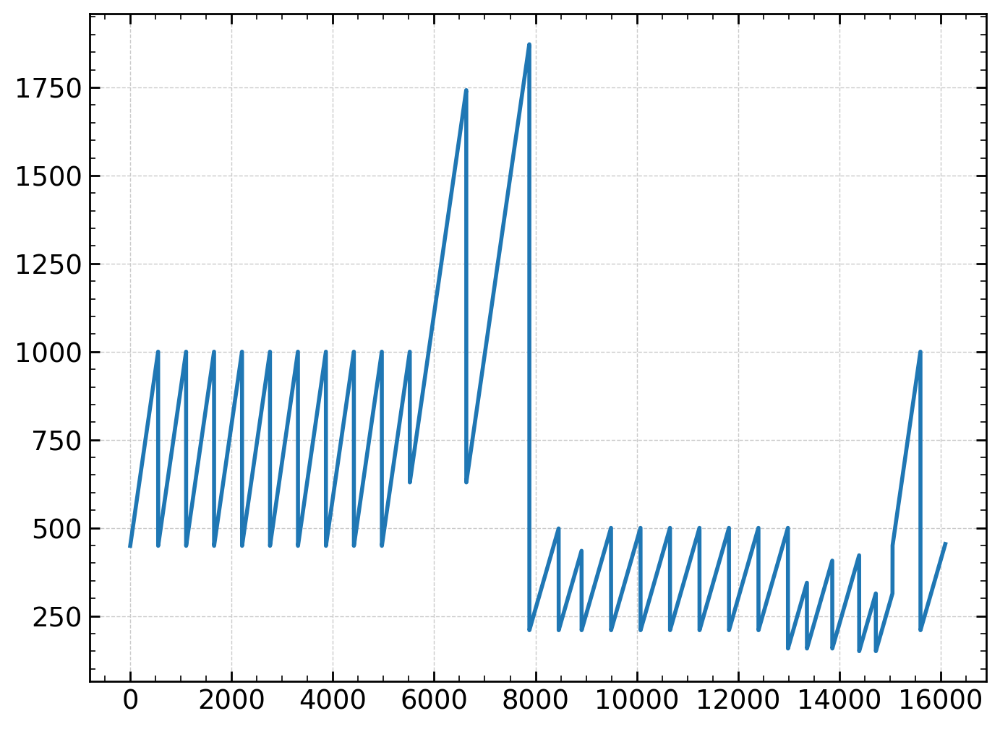

In [4]:
# "pt_df" is a pandas.DataFrame collecting relevant physical quantity time series from
# all simulations into a long-form array
# it will not be straightforward to bundle each model's points from this data
pt_df = pd.read_pickle("../data/points_all.p")
pt_logdf = np.log10(pt_df)

# one can bundle data for each model based on "time_code" field
# that is increasing within each model's data output
plt.plot(pt_df["time_code"])

In [5]:
# "qdset" is a xarray.Dataset storing the (16, 50, 84) percentile values and mean and std for each model's time series into an effectively 3D array.
with xr.open_dataarray("../data/percentiles_all.nc") as qdset:
    # get median values and convert it into pandas.DataFrame
    mid_df = qdset.sel(q="50").to_dataset(dim="variable").drop("q").to_dataframe()
    mid_logdf = np.log10(mid_df)

/Users/ckim/miniconda3/envs/prfm/lib/python3.11/site-packages/pandas/core/internals/blocks.py:329: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)
/Users/ckim/miniconda3/envs/prfm/lib/python3.11/site-packages/pandas/core/internals/blocks.py:329: RuntimeWarning: invalid value encountered in log10
  result = func(self.values, **kwargs)


In [6]:
yield_conv = (
    ((au.cm ** (-3) * au.K * ac.k_B) / (ac.M_sun / ac.kpc**2 / au.yr)).to("km/s").value
)

qdset_ = qdset.to_dataset("variable")
for yf in ["Ytot", "Yth", "Yturb", "Ymag", "oYmag", "dYmag"]:
    qdset_[yf] = (
        qdset_[yf.replace("Y", "Pi" if "mag" in yf else "P")]
        / qdset_["sfr"]
        * yield_conv
    )
qdset_["Ynonth"] = (qdset_["Pturb"] + qdset_["Pimag"]) / qdset_["sfr"] * yield_conv
qdset_["tdyn"] = 2*qdset_["tdyn"]
qdset_["edyn"] = 2*qdset_["edyn"]

In [7]:
# these are all quantity name stored in this data
# we are mostly interested in fitting "Yxxx" as a function of "W" and "Zgas"
print("PDE_2p_avg_approx_sp2" in qdset["variable"])
print("tdyn" in qdset["variable"])

True
True


In [29]:
for W_x in [1.e4,1.e5]:
    print(f"W_x={W_x}:")
    epe = lambda Zd: 1.5*np.log10(1e4/W_x+Zd+0.01)+2.6
    ftau = lambda Zd: (W_x/1.e4*Zd**2+0.01)**(-0.25)
    print(epe(0.1)/epe(3.),ftau(0.1)/ftau(3))
    print("")

W_x=10000.0:
0.7612554177546161 4.607058202019063

W_x=100000.0:
0.47417259096716025 5.348407869407853



In [13]:
qdset["name"]

<xarray.DataArray 'name' (name: 28)>
array(['R8_8pc_NCR_S30.full.b1.v3.iCR4.Zg1.Zd1.xy1024.eps0.0',
       'R8_8pc_NCR_S30.full.b1.v3.iCR4.Zg0.1.Zd0.1.xy2048.eps0.0',
       'R8_8pc_NCR.full.b10.v3.iCR4.Zg1.Zd1.xy2048.eps0.0',
       'R8_8pc_NCR.full.b10.v3.iCR4.Zg0.3.Zd0.3.xy4096.eps0.0',
       'R8_8pc_NCR.full.b10.v3.iCR4.Zg0.1.Zd0.1.xy4096.eps0.0',
       'R8_8pc_NCR.full.b10.v3.iCR4.Zg0.1.Zd0.025.xy4096.eps0.0',
       'R8_8pc_NCR.full.b1.v3.iCR4.Zg1.Zd1.xy2048.eps0.0',
       'R8_8pc_NCR.full.b1.v3.iCR4.Zg0.3.Zd0.3.xy4096.eps0.0',
       'R8_8pc_NCR.full.b1.v3.iCR4.Zg0.1.Zd0.1.xy4096.eps0.0',
       'R8_8pc_NCR.full.b1.v3.iCR4.Zg0.1.Zd0.025.xy4096.eps0.0',
       'LGR8_8pc_NCR_S05.full.b10.v3.iCR5.Zg1.Zd1.xy4096.eps0.0',
       'LGR8_8pc_NCR_S05.full.b10.v3.iCR5.Zg0.1.Zd0.1.xy8192.eps0.0',
       'LGR4_4pc_NCR_S100.full.b1.v3.iCR5.Zg1.Zd1.xy1024.eps1.e-8.rstZ01',
       'LGR4_4pc_NCR_S100.full.b1.v3.iCR4.Zg1.Zd1.xy1024.eps1.e-8',
       'LGR4_4pc_NCR_S100.full.b1.v3.iCR4.Zg0.1.Zd0.1.xy2048.eps1.e-8',
       'LGR4_4pc_NCR.full.b10.v3.iCR4.Zg1.Zd1.xy1024.eps1.e-8',
       'LGR4_4pc_NCR.full.b10.v3.iCR4.Zg0.1.Zd0.1.xy2048.eps1.e-8',
       'LGR4_4pc_NCR.full.b1.v3.iCR4.Zg1.Zd1.xy1024.eps1.e-8',
       'LGR4_4pc_NCR.full.b1.v3.iCR4.Zg0.3.Zd0.3.xy2048.eps1.e-8',
       'LGR4_4pc_NCR.full.b1.v3.iCR4.Zg0.1.Zd0.1.xy2048.eps1.e-8',
       'LGR4_4pc_NCR.full.b1.v3.iCR4.Zg0.1.Zd0.025.xy2048.eps1.e-8',
       'LGR2_4pc_NCR_S150.full.b2.Om02.v3.iCR5.Zg1.Zd1.xy1024.eps1.e-8.rstZ01',
       'LGR2_4pc_NCR_S150.full.b2.Om02.v3.iCR5.Zg1.Zd1.xy1024.eps1.e-8',
       'LGR2_4pc_NCR_S150.full.b2.Om02.v3.iCR5.Zg0.1.Zd0.1.xy2048.eps1.e-8',
       'LGR2_4pc_NCR_S150.full.b2.Om01.q0.v3.iCR5.Zg0.1.Zd0.1.xy2048.eps1.e-8',
       'LGR2_4pc_NCR_S150.full.b2.Om01.q0.v3.iCR5.Zg1.Zd1.xy1024.eps1.e-8',
       'R8_8pc_NCR.full.b1.v3.iCR4.Zg3.Zd3.xy1024.eps1.e-8',
       'LGR4_4pc_NCR.full.b1.v3.iCR4.Zg3.Zd3.xy1024.eps1.e-8'], dtype=object)
Coordinates:
  * name     (name) object 'R8_8pc_NCR_S30.full.b1.v3.iCR4.Zg1.Zd1.xy1024.eps...

In [14]:
# nsel=[]
# for n in qdset['name'].data:
#     if ('R8_8pc_NCR.full.b10' in n or
#         'LGR4_4pc_NCR.full.b10' in n or
#         'rstZ01' in n):
#         print(n)
#     else:
#         nsel.append(n)

In [15]:
# qdset = qdset.sel(name=nsel)

# fitting with mean and std

In [16]:
# We are fitting variables as a function of "W" and "Zgas"
# I set the parameter range of interest (in log scale) here
Zmin = -1.3
Zmax = 0.5
Wmin = 2.7
Wmax = 6.3

In [17]:
# setup figure output directory
# outdir = './lowZ-figures-nolegend/'
# outdir = './lowZ-figures-mean/'
# os.makedirs(outdir,exist_ok=True)
# outdir = '/tigress/changgoo/public_html/TIGRESS-NCR/lowZ-figures/'

In [18]:
# reference TIGRESS line property
Wref_min = 2.5
Wref_max = 6.5
Wref = np.linspace(Wref_min, Wref_max, 100)
ref_kwargs = dict(ls="--", color="k", lw=1)

Beta: [ 4.15077631  1.18959342 -0.01064454]
Beta Std Error: [0.02840544 0.02726839 0.0330033 ]
Beta Covariance: [[ 0.23790988 -0.13817384  0.15959995]
 [-0.13817384  0.2192444  -0.02583061]
 [ 0.15959995 -0.02583061  0.32116193]]
Residual Variance: 0.0033914903845636392
Inverse Condition #: 0.049560180336263464
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.14856713694561224
L2 : 0.19719404227143497


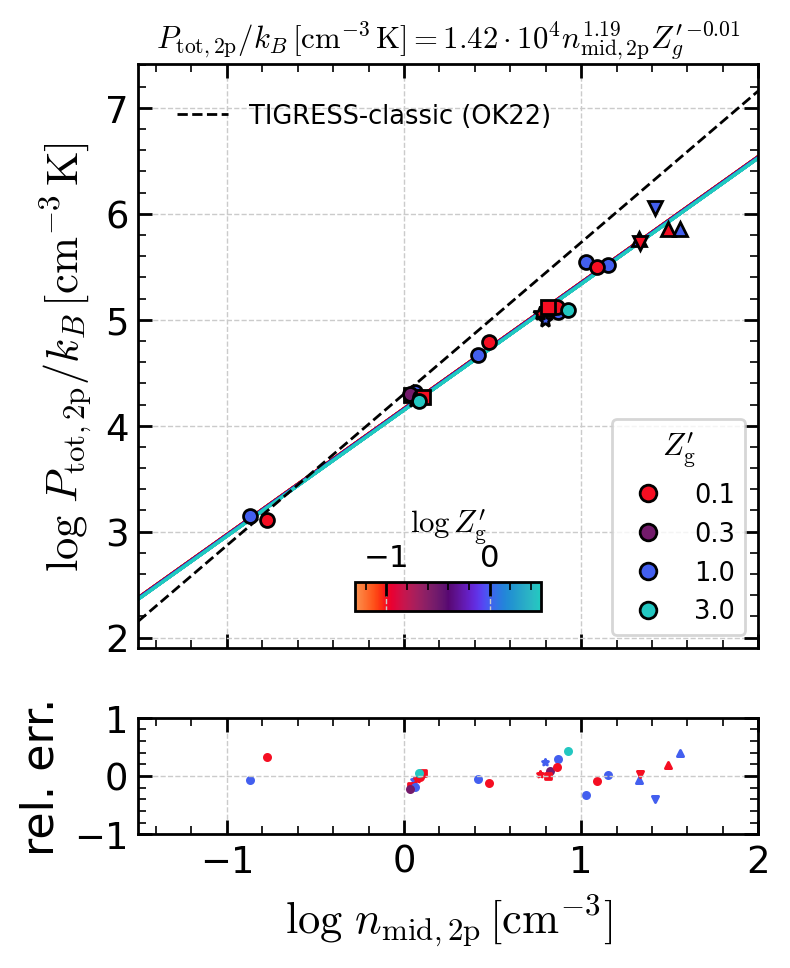

In [18]:
# Figure for the effective Equation of State (eEOS)
fig, axes = plt.subplots(
    2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
)

# set field names for x-axes and yaxis
# here we fit Ptot as a function of nH and Zgas
x1, x2, yf = ["nH", "Zgas", "Ptot"]

# linear regression
odr_out = fit_odr(qdset, xf1=x1, xf2=x2, yf=yf)
# construct model (not the x1-axis is not W and the parameter range is changed)
model_dset = get_model_odr(
    odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=-1.5, Wmax=2, dims=[x2, x1]
)

# plot simulation data along with fitting result
plt.sca(axes[0])
# write fitting result as the axis title
a = odr_out.beta[1]
b = odr_out.beta[2]
Y0 = 10 ** odr_out.beta[0]
tit = (
    labels[yf]
    + f"$={scifmt(Y0)} n_{{\\rm mid,2p}}^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
)
plt.title(tit, fontsize="x-small")

# call plotting script
plot_fitting_mean(qdset, model_dset, x1, yf, legend=4, colorbar=8, model=True)
# plot all data as grey dots
# plt.plot(pt_df[x1],pt_df[yf],'.',color='grey',alpha=0.1,mew=0,zorder=-1)
plt.xlabel("")

# plot residual compared with the fitting result
plt.sca(axes[1])
plot_fitting_mean(qdset, model_dset, x1, yf, residual=True, model=True)

plt.xlim(-1.5, 2)
# add reference line from the previous result (Ostriker & Kim 2022 Eq 27, Figure 14)
nH = model_dset.nH.data
plt.sca(axes[0])
plt.plot(nH, 4.3 + nH * 1.43, **ref_kwargs)
leg1 = plt.gca().get_legend()
custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
leg2 = plt.legend(
    custom_lines2,
    ["TIGRESS-classic (OK22)"],
    loc=2,
    borderpad=1,
    fontsize="xx-small",
    frameon=False,
)
plt.gca().add_artist(leg1)

# decorate axis
fig.axes[-1].xaxis.set_ticks_position("top")
fig.axes[-1].xaxis.set_label_position("top")
plt.setp(fig.axes[-1].get_xticklabels(), "fontsize", "x-small")
fig.axes[-1].set_xlabel(fig.axes[-1].get_xlabel(), fontsize="x-small")

# save figure
plt.savefig(os.path.join(outdir, "eEOS_fit.png"), bbox_inches="tight")

In [32]:
print(np.sqrt((1.e4*ac.k_B/au.cm**3*au.K)/(1.4*ac.m_p/au.cm**3)*(1.e4/Y0)**(-1/1.19)).to("km/s"))
print((1-1/a)/2)
print(-(b/a)/2)

8.884441255950005 km / s
0.07968832635796208
0.004474024380425538


Beta: [4.45499816 1.2933219  0.09868874]
Beta Std Error: [0.041379   0.05274706 0.05600767]
Beta Covariance: [[ 0.19290707 -0.08918049  0.15797177]
 [-0.08918049  0.31346179  0.00432374]
 [ 0.15797177  0.00432374  0.35341357]]
Residual Variance: 0.008875888225097179
Inverse Condition #: 0.07214969789933287
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.25125384343419765
L2 : 0.35741921509919794


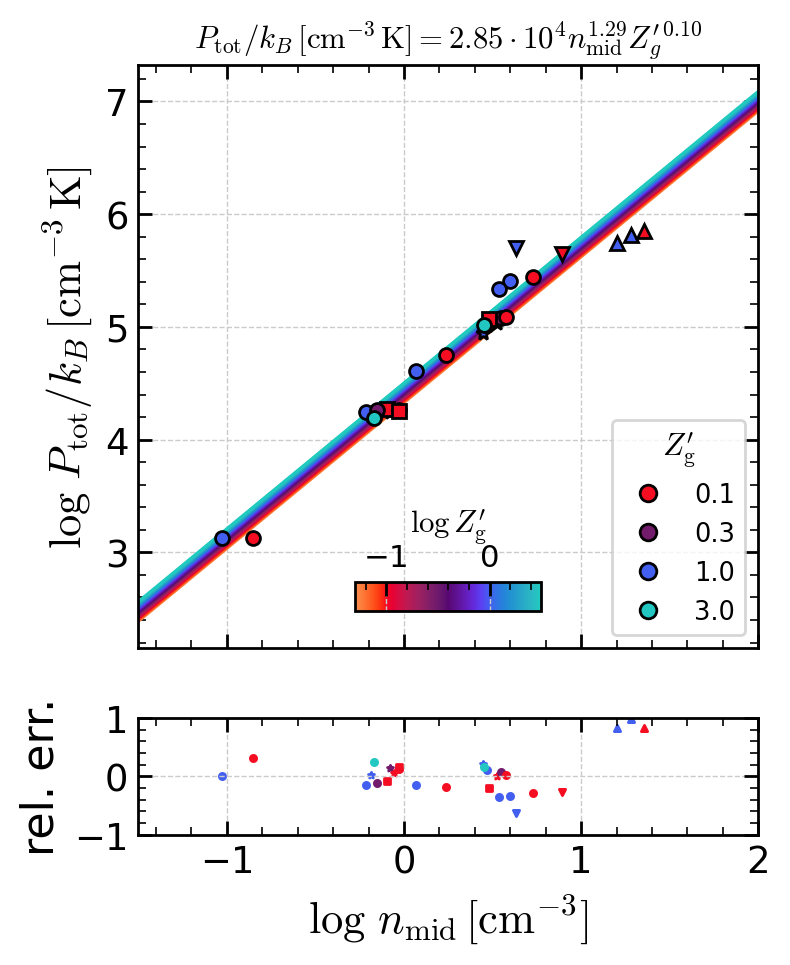

In [21]:
# Figure for the effective Equation of State (eEOS)
fig, axes = plt.subplots(
    2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
)

# set field names for x-axes and yaxis
# here we fit Ptot as a function of nH and Zgas
x1, x2, yf = ["nH_all", "Zgas", "Ptot_all"]

# linear regression
odr_out = fit_odr(qdset, xf1=x1, xf2=x2, yf=yf)
# construct model (not the x1-axis is not W and the parameter range is changed)
model_dset = get_model_odr(
    odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=-1.5, Wmax=2, dims=[x2, x1]
)

# plot simulation data along with fitting result
plt.sca(axes[0])
# write fitting result as the axis title
a = odr_out.beta[1]
b = odr_out.beta[2]
Y0 = 10 ** odr_out.beta[0]
tit = (
    labels[yf]
    + f"$={scifmt(Y0)} n_{{\\rm mid}}^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
)
plt.title(tit, fontsize="x-small")

# call plotting script
plot_fitting_mean(qdset, model_dset, x1, yf, legend=4, colorbar=8, model=True)
# plot all data as grey dots
# plt.plot(pt_df[x1],pt_df[yf],'.',color='grey',alpha=0.1,mew=0,zorder=-1)
# plt.ylabel(r"$\log\,$" + labels['])
plt.xlabel("")

# plot residual compared with the fitting result
plt.sca(axes[1])
plot_fitting_mean(qdset, model_dset, x1, yf, residual=True, model=True)
# plt.xlabel(r"$\log\,$" + labels['nH'])

plt.xlim(-1.5, 2)
# add reference line from the previous result (Ostriker & Kim 2022 Eq 27, Figure 14)
# nH = model_dset[x1].data
# plt.sca(axes[0])
# plt.plot(nH, 4.3 + nH * 1.43, **ref_kwargs)
# leg1 = plt.gca().get_legend()
# custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
# leg2 = plt.legend(
#     custom_lines2,
#     ["TIGRESS-classic (OK22)"],
#     loc=2,
#     borderpad=1,
#     fontsize="xx-small",
#     frameon=False,
# )
# plt.gca().add_artist(leg1)

# decorate axis
fig.axes[-1].xaxis.set_ticks_position("top")
fig.axes[-1].xaxis.set_label_position("top")
plt.setp(fig.axes[-1].get_xticklabels(), "fontsize", "x-small")
fig.axes[-1].set_xlabel(fig.axes[-1].get_xlabel(), fontsize="x-small")

# save figure
plt.savefig(os.path.join(outdir, "eEOS_all_fit.png"), bbox_inches="tight")

In [34]:
print(np.sqrt((1.e4*ac.k_B/au.cm**3*au.K)/(1.4*ac.m_p/au.cm**3)*(1.e4/Y0)**(-1/1.19)).to("km/s"))
print((1-1/a)/2)
print(-(b/a)/2)

11.924891293005196 km / s
0.11339864314558046
-0.03815320271498003


Beta: [0.59686177 0.11746938 0.02958427]
Beta Std Error: [0.0508508  0.01031873 0.01427983]
Beta Covariance: [[ 1.70121508 -0.3387236   0.08922374]
 [-0.3387236   0.0700513  -0.00600083]
 [ 0.08922374 -0.00600083  0.13415591]]
Residual Variance: 0.0015199746063738956
Inverse Condition #: 0.0033136811889109296
Reason(s) for Halting:
  Sum of squares convergence


L1 : 0.0668125380190833
L2 : 0.08407694060022179
Beta: [ 0.59977039  0.08837773 -0.00196281]
Beta Std Error: [0.06526977 0.01324461 0.01832931]
Beta Covariance: [[ 1.68972742 -0.33643512  0.08863399]
 [-0.33643512  0.0695778  -0.00596251]
 [ 0.08863399 -0.00596251  0.13325529]]
Residual Variance: 0.0025212015239891865
Inverse Condition #: 0.003313653704004193
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.07536545237597382
L2 : 0.10519383645524158
Beta: [0.38683339 0.11934717 0.07551983]
Beta Std Error: [0.17987571 0.03650249 0.05051294]
Beta Covariance: [[ 1.71052467 -0.34059494  0.08954652]
 [-0.34059494  0.07044162 -0.00599891]
 [ 0.08954652 -0.00599891  0.13489305]]
Residual Variance: 0.01891540670240671
Inverse Condition #: 0.003313572975973319
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.21450522996212257
L2 : 0.3430342360965945
Beta: [0.18629559 0.13054115 0.1061368 ]
Beta Std Error: [0.17262607 0.03503185 0.04848363]
Beta Covariance: [[ 1.72452307 -0.3

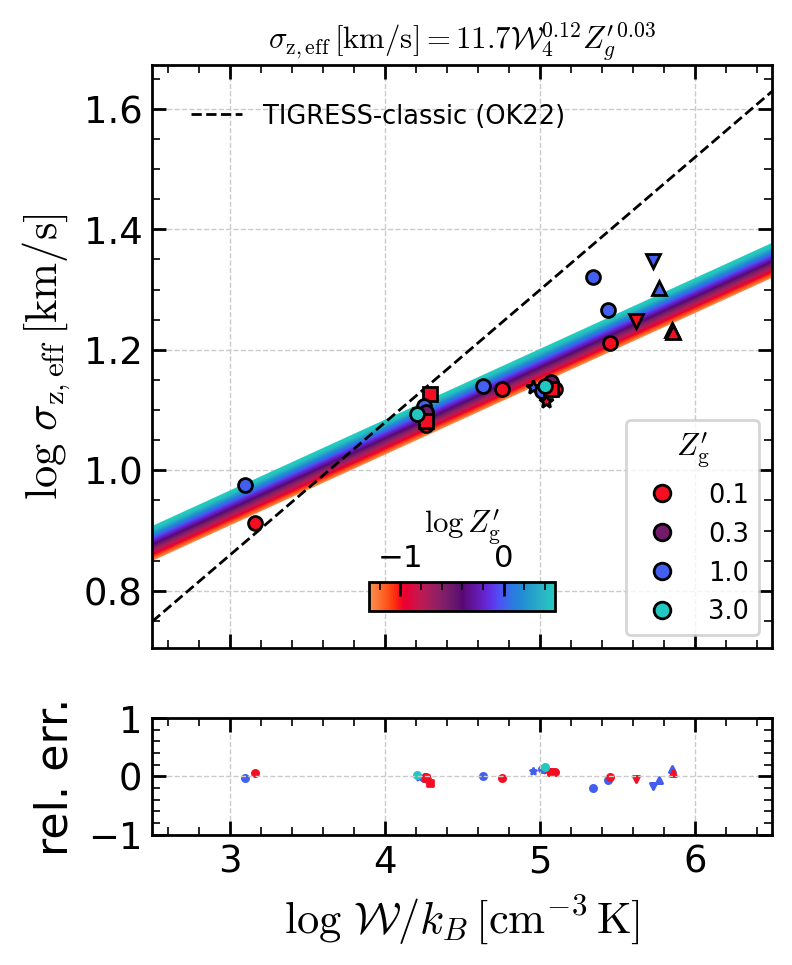

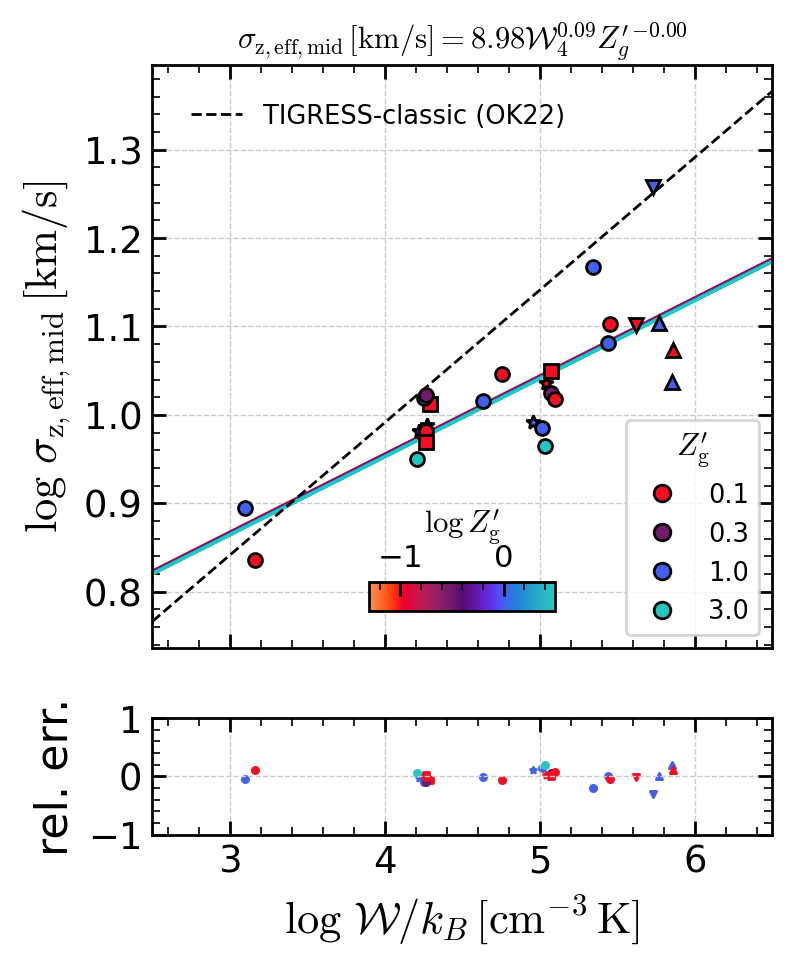

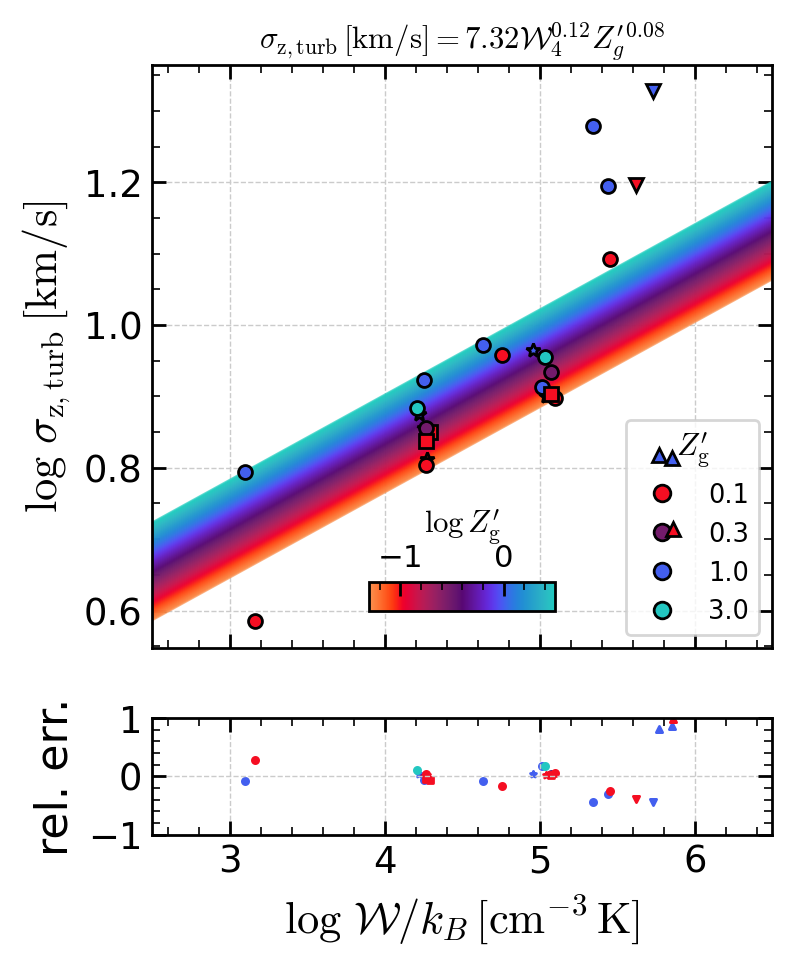

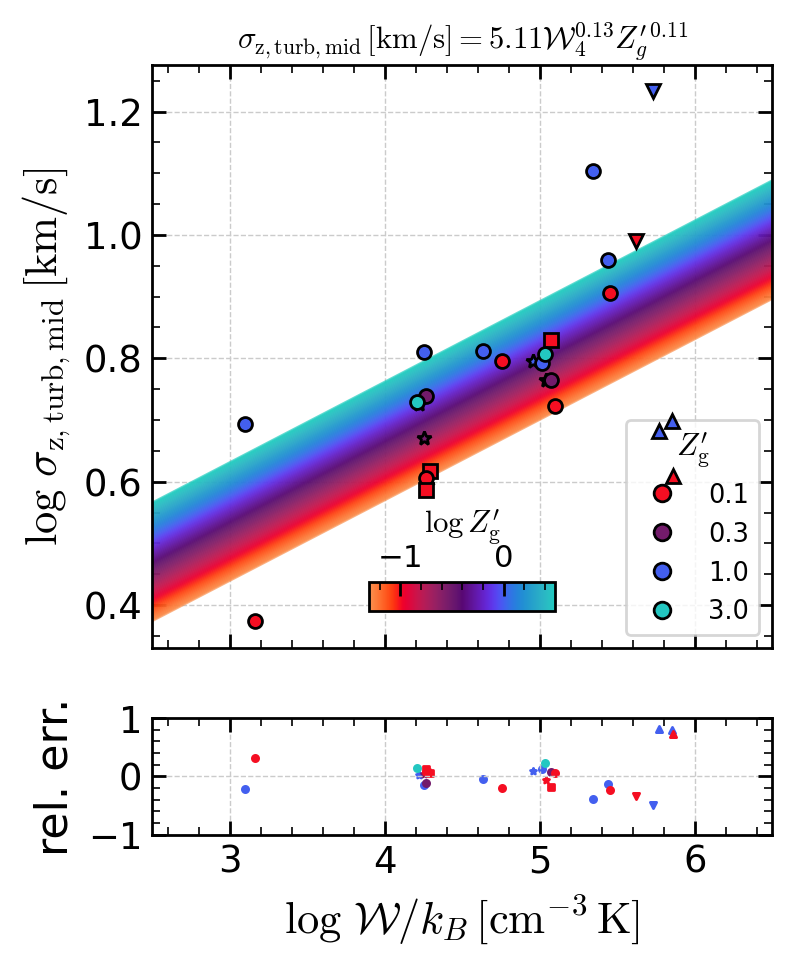

In [14]:
# Figure for the velocity dispersions
for yf in ["sigma_eff", "sigma_eff_mid", "sigma_turb", "sigma_turb_mid"]:
    fig, axes = plt.subplots(
        2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
    )

    # set field names for x-axes and yaxis
    # here we fit Ptot as a function of nH and Zgas
    x1, x2 = ["W", "Zgas"]

    # linear regression
    odr_out = fit_odr(qdset, xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset = get_model_odr(odr_out, Zmin=Zmin, Zmax=Zmax, dims=[x2, x1])

    # plot simulation data along with fitting result
    plt.sca(axes[0])
    # write fitting result as the axis title
    a = odr_out.beta[1]
    b = odr_out.beta[2]
    Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
    tit = (
        labels[yf]
        + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
    )
    plt.title(tit, fontsize="x-small")

    # call plotting script
    plot_fitting_mean(qdset, model_dset, x1, yf, legend=4, colorbar=8, model=True)
    # plot all data as grey dots
    # plt.plot(pt_df[x1],pt_df[yf],'.',color='grey',alpha=0.1,mew=0,zorder=-1)
    plt.xlabel("")

    # plot residual compared with the fitting result
    plt.sca(axes[1])
    plot_fitting_mean(qdset, model_dset, x1, yf, residual=True, model=True)

    # add reference line from the previous result (Ostriker & Kim 2022 Eq 27, Figure 14)
    plt.sca(axes[0])
    plt.xlim(Wref_min, Wref_max)
    # plt.plot(W,np.log10(9.05)+0.08*(W-4),ls='--',color='r',lw=1)
    if "turb" not in yf:
        if "mid" in yf:
            plt.plot(Wref, np.log10(9.8) + 0.15 * (Wref - 4), **ref_kwargs)
        else:
            plt.plot(Wref, np.log10(12) + 0.22 * (Wref - 4), **ref_kwargs)
        leg1 = plt.gca().get_legend()
        custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
        leg2 = plt.legend(
            custom_lines2,
            ["TIGRESS-classic (OK22)"],
            loc=2,
            borderpad=1,
            fontsize="xx-small",
            frameon=False,
        )
        plt.gca().add_artist(leg1)

    # decorate axis
    fig.axes[-1].xaxis.set_ticks_position("top")
    fig.axes[-1].xaxis.set_label_position("top")
    plt.setp(fig.axes[-1].get_xticklabels(), "fontsize", "x-small")
    fig.axes[-1].set_xlabel(fig.axes[-1].get_xlabel(), fontsize="x-small")

    # save figure
    plt.savefig(os.path.join(outdir, f"{yf}_fit.png"), bbox_inches="tight")

Beta: [0.38683294 0.11934725 0.07551971]
Beta Std Error: [0.17987569 0.03650249 0.05051291]
Beta Covariance: [[ 1.7105244  -0.34059495  0.08954593]
 [-0.34059495  0.07044163 -0.00599881]
 [ 0.08954593 -0.00599881  0.13489288]]
Residual Variance: 0.018915406702681384
Inverse Condition #: 0.0033135736498115507
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.21450524462493625
L2 : 0.3430342947742975


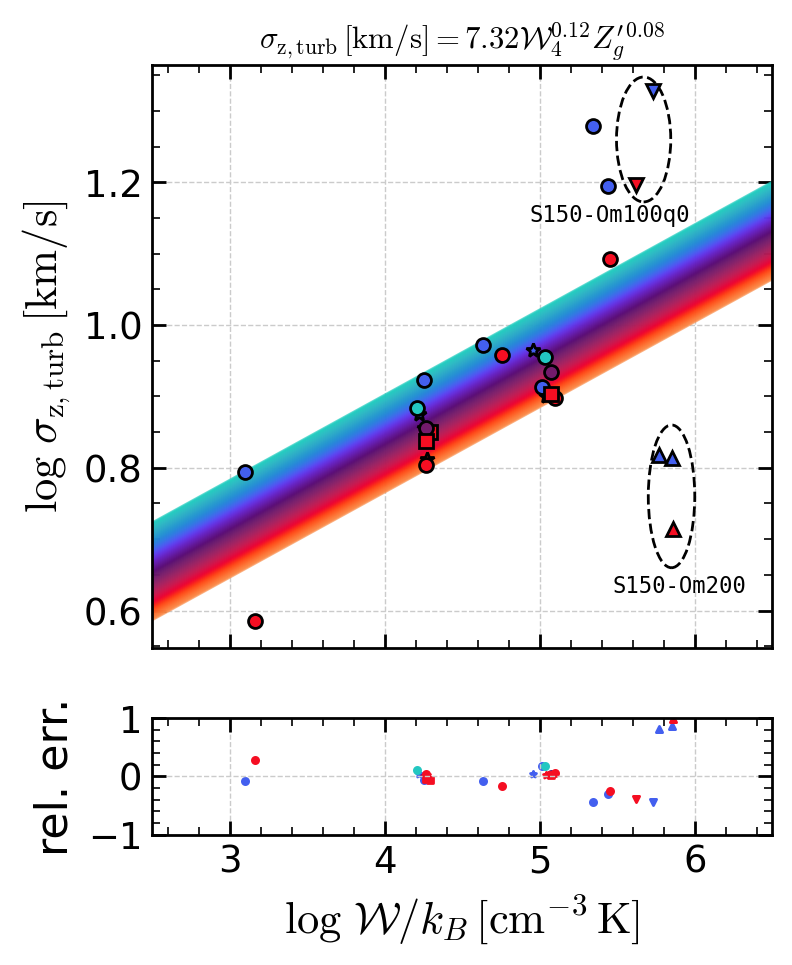

In [18]:
# Figure for the velocity dispersions
yf = "sigma_turb"
fig, axes = plt.subplots(
    2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
)

# set field names for x-axes and yaxis
# here we fit Ptot as a function of nH and Zgas
x1, x2 = ["W", "Zgas"]

# linear regression
odr_out = fit_odr(qdset, xf1=x1, xf2=x2, yf=yf)
# construct model (not the x1-axis is not W and the parameter range is changed)
model_dset = get_model_odr(odr_out, Zmin=Zmin, Zmax=Zmax, dims=[x2, x1])

# plot simulation data along with fitting result
plt.sca(axes[0])
# write fitting result as the axis title
a = odr_out.beta[1]
b = odr_out.beta[2]
Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
tit = (
    labels[yf]
    + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
)
plt.title(tit, fontsize="x-small")

# call plotting script
plot_fitting_mean(qdset, model_dset, x1, yf, legend=0, colorbar=0, model=True)
plt.xlabel("")

# plot residual compared with the fitting result
plt.sca(axes[1])
plot_fitting_mean(qdset, model_dset, x1, yf, residual=True, model=True)

# add reference line from the previous result (Ostriker & Kim 2022 Eq 27, Figure 14)
W = model_dset.W.data
plt.sca(axes[0])

# two labels
el = Ellipse((5.67, 1.26), 0.35, 0.175, ls="--", fc="none", color="k", lw=1)
axes[0].add_artist(el)
plt.annotate(
    "S150-Om100q0", (5.45, 1.155), family="monospace", fontsize=8, ha="center", va="center"
)

el = Ellipse((5.85, 0.76), 0.3, 0.2, ls="--", fc="none", color="k", lw=1, zorder=20)
axes[0].add_artist(el)
plt.annotate(
    "S150-Om200", (5.9, 0.65), family="monospace", fontsize=8, ha="center", va="top"
)
plt.xlim(Wref_min, Wref_max)
# save figure
plt.savefig(os.path.join(outdir, f"{yf}_fit_nolegend.png"), bbox_inches="tight")

Beta: [-0.12184464  1.03869361  0.04082263]
Beta Std Error: [0.08287275 0.01681739 0.0232531 ]
Beta Covariance: [[ 3.49400378 -0.69573149  0.18297795]
 [-0.69573149  0.14388549 -0.01231021]
 [ 0.18297795 -0.01231021  0.27508151]]
Residual Variance: 0.001965622618640722
Inverse Condition #: 0.0033110638960761685
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.1376808939708719
L2 : 0.25769858643141363
Beta: [-0.04240246  0.99860419  0.00573199]
Beta Std Error: [0.07133883 0.01447657 0.02002105]
Beta Covariance: [[ 3.35270213 -0.66757889  0.17569452]
 [-0.66757889  0.138062   -0.01182625]
 [ 0.17569452 -0.01182625  0.26406844]]
Residual Variance: 0.001517948422520505
Inverse Condition #: 0.0033116712151759916
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.12832774805361022
L2 : 0.15048919177439526
Beta: [ 0.37026511  0.91521451 -0.04123485]
Beta Std Error: [0.05349857 0.01085611 0.0150183 ]
Beta Covariance: [[ 3.08591853 -0.61444076  0.16181124]
 [-0.61444076  0.127

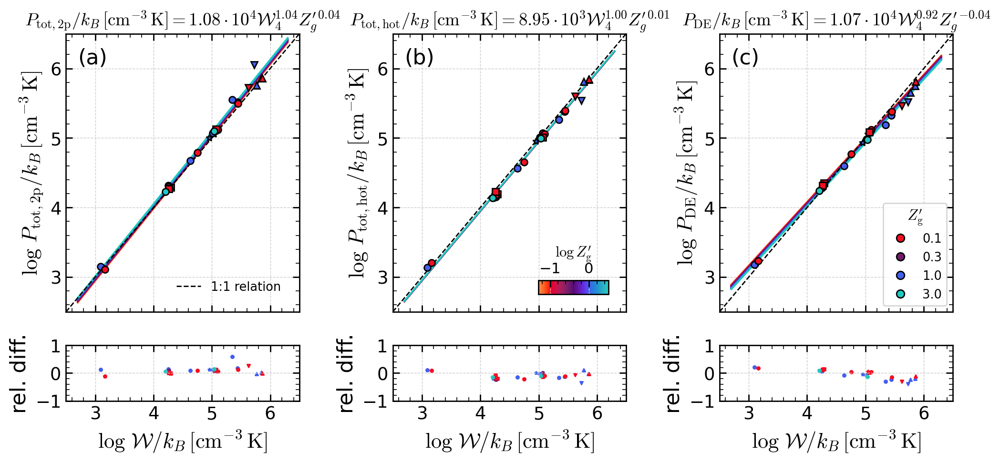

In [45]:
# Figure for
# (a) vertical dynamical equilibrium (Ptot vs W)
# (b) pressure equilibrium between phases (Ptot_hot vs W)
# (c) comparison with analytic weight estimator (PDE from Equation 7 in Ostriker & Kim 2022 vs W)
fig, axes_ = plt.subplots(
    2,
    3,
    sharex="col",
    figsize=(12, 5),
    gridspec_kw=dict(height_ratios=[1, 0.2], wspace=0.4, hspace=0.2),
)

# set field names for x-axes
x1, x2 = ["W", "Zgas"]
for yf, axes in zip(["Ptot", "Ptot_hot", "PDE_2p_avg_approx"], axes_.T):
    # linear regression
    odr_out = fit_odr(qdset, xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # plot simulation data along with fitting result
    plt.sca(axes[0])

    # write fitting result as the axis title
    a = odr_out.beta[1]
    b = odr_out.beta[2]
    Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
    l = labels[yf] if yf in labels else labels["PDE"]
    tit = (
        l + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
    )
    plt.title(tit, fontsize="small")

    # call plotting script
    sm = plot_fitting_mean(
        qdset,
        model_dset,
        x1,
        yf,
        legend=4 if yf.startswith("PDE") else 0,
        colorbar=4 if yf.startswith("Ptot_hot") else 0,
        model=True,
    )
    # plot one-to-one line
    plt.plot([Wref_min, Wref_max], [Wref_min, Wref_max], **ref_kwargs)
    plt.xlim(Wref_min, Wref_max)
    plt.ylim(Wref_min, Wref_max)
    # plot all data points as grey dots
    # plt.plot(pt_df[x1],pt_df[yf],'.',color='grey',alpha=0.1,mew=0,zorder=-1)
    plt.xlabel("")
    # plt.ylim(3.e2,3.e6)

    # plot residual by comparing x and y field (not comparing with model; model = False)
    plt.sca(axes[1])
    plot_fitting_mean(qdset, model_dset, x1, yf, residual=True, model=False)

# decorate figure
fig.axes[-1].xaxis.set_ticks_position("top")
fig.axes[-1].xaxis.set_label_position("top")
plt.setp(fig.axes[-1].get_xticklabels(), "fontsize", "x-small")
fig.axes[-1].set_xlabel(fig.axes[-1].get_xlabel(), fontsize="x-small")

# add custom legend
plt.sca(axes_[0, 0])
custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
leg2 = plt.legend(
    custom_lines2,
    ["1:1 relation"],
    loc=4,
    borderpad=1,
    fontsize="xx-small",
    frameon=False,
)

# add panel label (a), (b), ...
add_panel_labels(axes_[0, :])

# save figure
plt.savefig(os.path.join(outdir, "PW_fit.png"), bbox_inches="tight")

Beta: [-0.12184464  1.03869361  0.04082263]
Beta Std Error: [0.08287275 0.01681739 0.0232531 ]
Beta Covariance: [[ 3.49400378 -0.69573149  0.18297795]
 [-0.69573149  0.14388549 -0.01231021]
 [ 0.18297795 -0.01231021  0.27508151]]
Residual Variance: 0.001965622618640722
Inverse Condition #: 0.0033110638960761685
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.1376808939708719
L2 : 0.25769858643141363
Beta: [-0.04240246  0.99860419  0.00573199]
Beta Std Error: [0.07133883 0.01447657 0.02002105]
Beta Covariance: [[ 3.35270213 -0.66757889  0.17569452]
 [-0.66757889  0.138062   -0.01182625]
 [ 0.17569452 -0.01182625  0.26406844]]
Residual Variance: 0.001517948422520505
Inverse Condition #: 0.0033116712151759916
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.12832774805361022
L2 : 0.15048919177439526
Beta: [ 0.14865937  0.97699767 -0.01455256]
Beta Std Error: [0.01746024 0.00354304 0.00490305]
Beta Covariance: [[ 3.27746013 -0.65256162  0.17191441]
 [-0.65256162  0.134

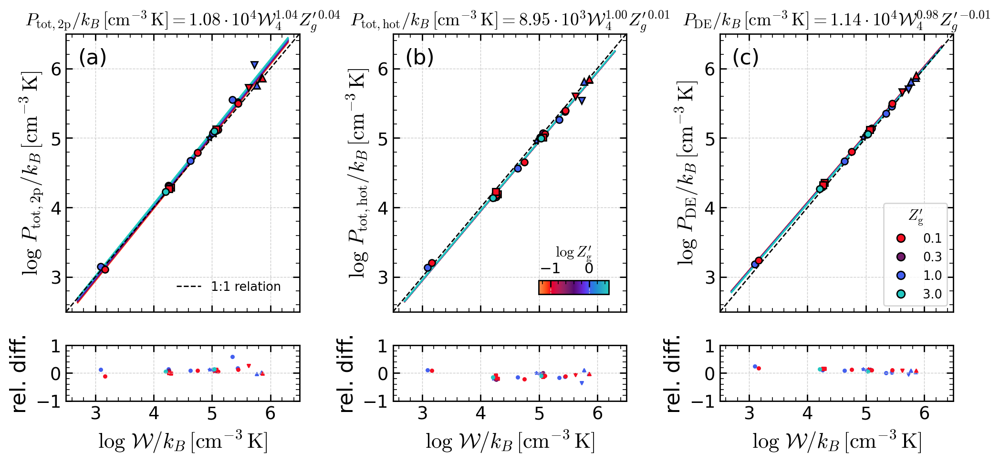

In [46]:
# Figure for
# (a) vertical dynamical equilibrium (Ptot vs W)
# (b) pressure equilibrium between phases (Ptot_hot vs W)
# (c) comparison with analytic weight estimator (PDE from Equation 7 in Ostriker & Kim 2022 vs W)
fig, axes_ = plt.subplots(
    2,
    3,
    sharex="col",
    figsize=(12, 5),
    gridspec_kw=dict(height_ratios=[1, 0.2], wspace=0.4, hspace=0.2),
)

# set field names for x-axes
x1, x2 = ["W", "Zgas"]
for yf, axes in zip(["Ptot", "Ptot_hot", "PDE_2p_avg_approx_sp"], axes_.T):
    # linear regression
    odr_out = fit_odr(qdset, xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # plot simulation data along with fitting result
    plt.sca(axes[0])

    # write fitting result as the axis title
    a = odr_out.beta[1]
    b = odr_out.beta[2]
    Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
    l = labels[yf] if yf in labels else labels["PDE"]
    tit = (
        l + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
    )
    plt.title(tit, fontsize="small")

    # call plotting script
    sm = plot_fitting_mean(
        qdset,
        model_dset,
        x1,
        yf,
        legend=4 if yf.startswith("PDE") else 0,
        colorbar=4 if yf.startswith("Ptot_hot") else 0,
        model=True,
    )
    # plot one-to-one line
    plt.plot([Wref_min, Wref_max], [Wref_min, Wref_max], **ref_kwargs)
    plt.xlim(Wref_min, Wref_max)
    plt.ylim(Wref_min, Wref_max)
    # plot all data points as grey dots
    # plt.plot(pt_df[x1],pt_df[yf],'.',color='grey',alpha=0.1,mew=0,zorder=-1)
    plt.xlabel("")
    # plt.ylim(3.e2,3.e6)

    # plot residual by comparing x and y field (not comparing with model; model = False)
    plt.sca(axes[1])
    plot_fitting_mean(qdset, model_dset, x1, yf, residual=True, model=False)

# decorate figure
fig.axes[-1].xaxis.set_ticks_position("top")
fig.axes[-1].xaxis.set_label_position("top")
plt.setp(fig.axes[-1].get_xticklabels(), "fontsize", "x-small")
fig.axes[-1].set_xlabel(fig.axes[-1].get_xlabel(), fontsize="x-small")

# add custom legend
plt.sca(axes_[0, 0])
custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
leg2 = plt.legend(
    custom_lines2,
    ["1:1 relation"],
    loc=4,
    borderpad=1,
    fontsize="xx-small",
    frameon=False,
)

# add panel label (a), (b), ...
add_panel_labels(axes_[0, :])

# save figure
plt.savefig(os.path.join(outdir, "PW_fit_sp.png"), bbox_inches="tight")

Beta: [ 4.71702832 -0.34759793 -0.35560056]
Beta Std Error: [0.21714278 0.04408953 0.06113089]
Beta Covariance: [[ 2.09521708 -0.41741283  0.10751623]
 [-0.41741283  0.08637919 -0.00681807]
 [ 0.10751623 -0.00681807  0.16605793]]
Residual Variance: 0.02250410548438767
Inverse Condition #: 0.003315270978957917
Reason(s) for Halting:
  Sum of squares convergence
Ytot
L1 : 0.3032275745035067
L2 : 0.41292638352816813
Beta: [ 4.73563414 -0.52081986 -0.61647401]
Beta Std Error: [0.14946952 0.03034287 0.04207222]
Beta Covariance: [[ 2.77137535 -0.55200579  0.14329928]
 [-0.55200579  0.11420978 -0.00925184]
 [ 0.14329928 -0.00925184  0.21957402]]
Residual Variance: 0.008061389626626938
Inverse Condition #: 0.0033153024808876353
Reason(s) for Halting:
  Sum of squares convergence
Yth
L1 : 0.20462257575721304
L2 : 0.28687360906096493
Beta: [ 3.92718497 -0.26875299 -0.12797701]
Beta Std Error: [0.2562731  0.05202294 0.0719108 ]
Beta Covariance: [[ 1.83066463 -0.36465091  0.09464461]
 [-0.36465091

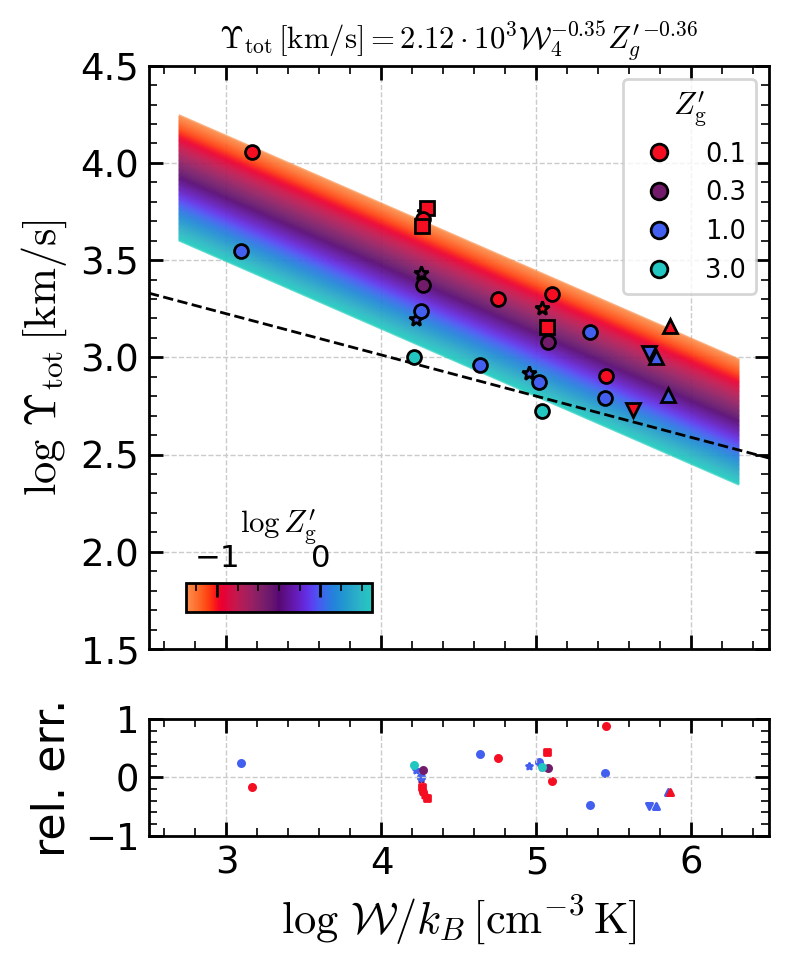

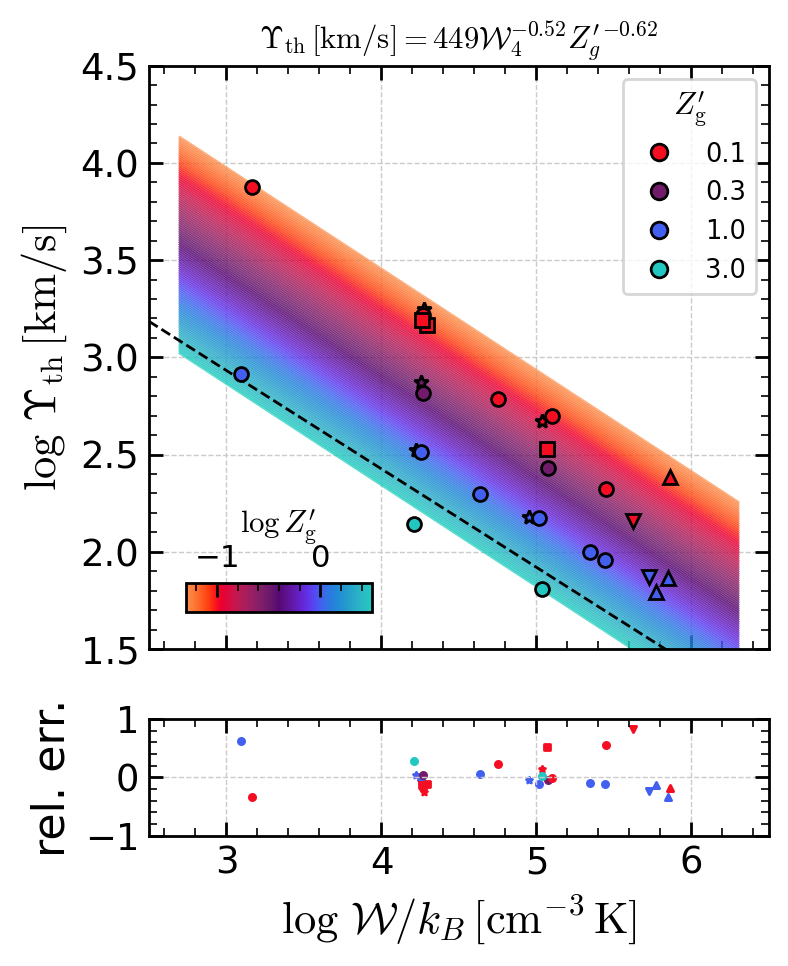

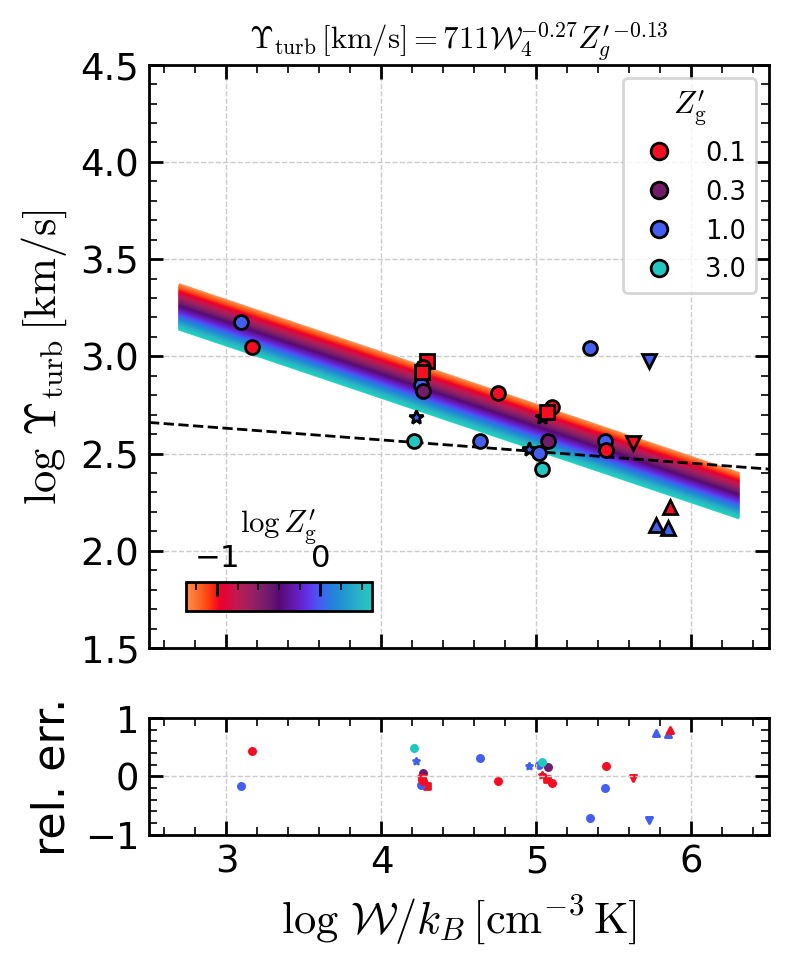

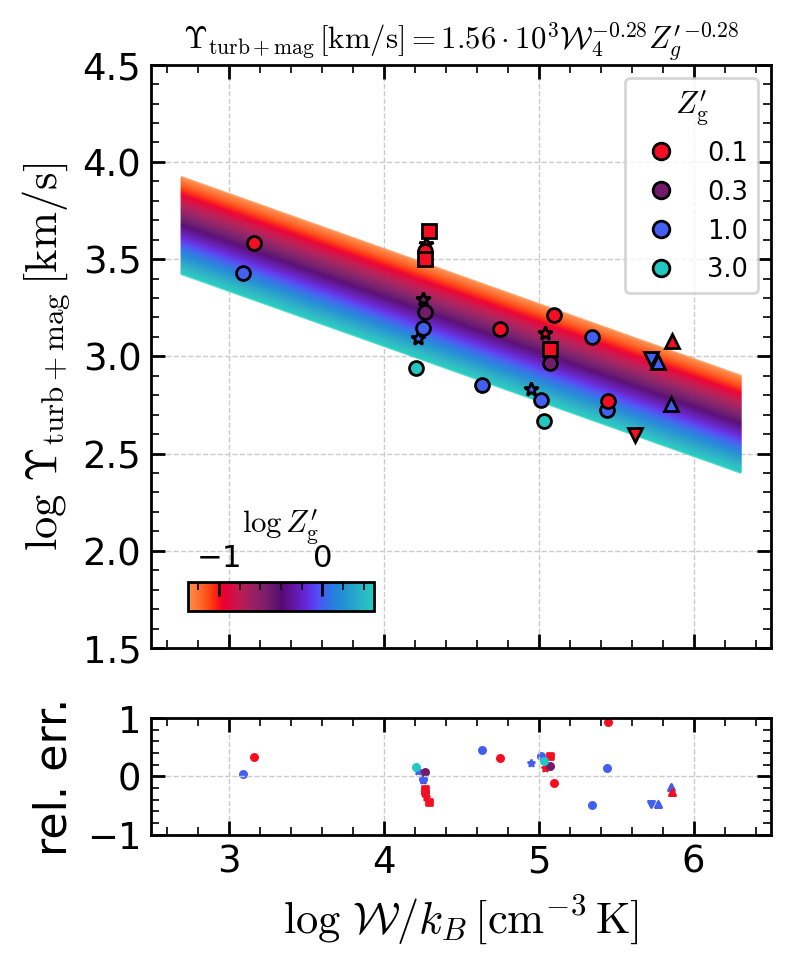

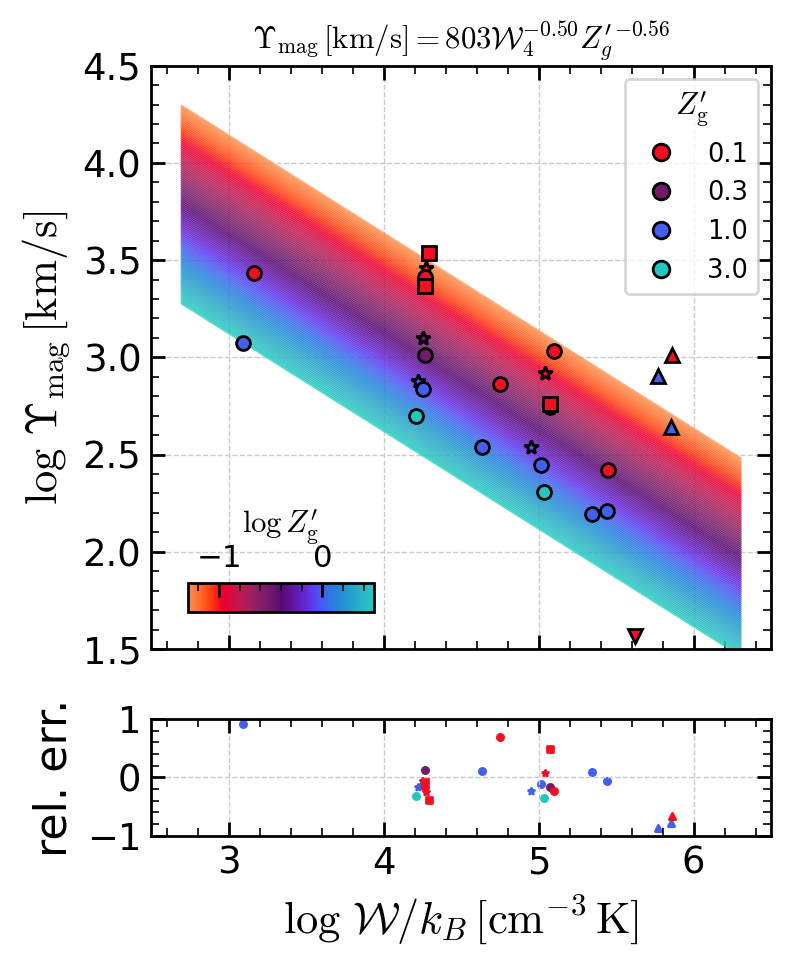

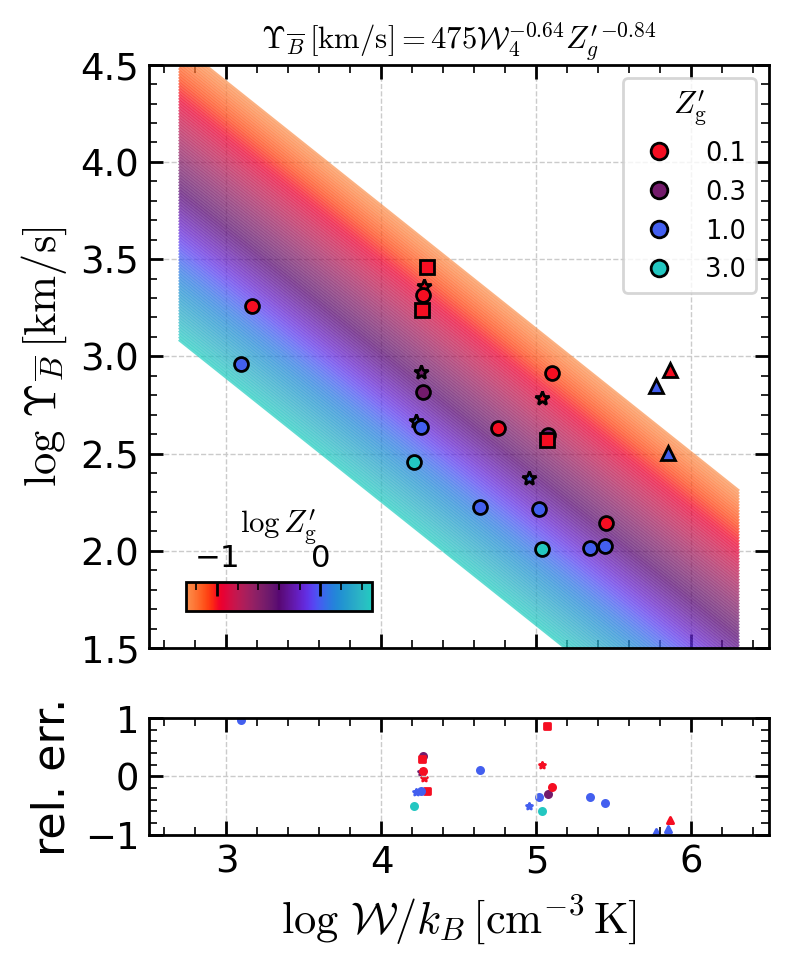

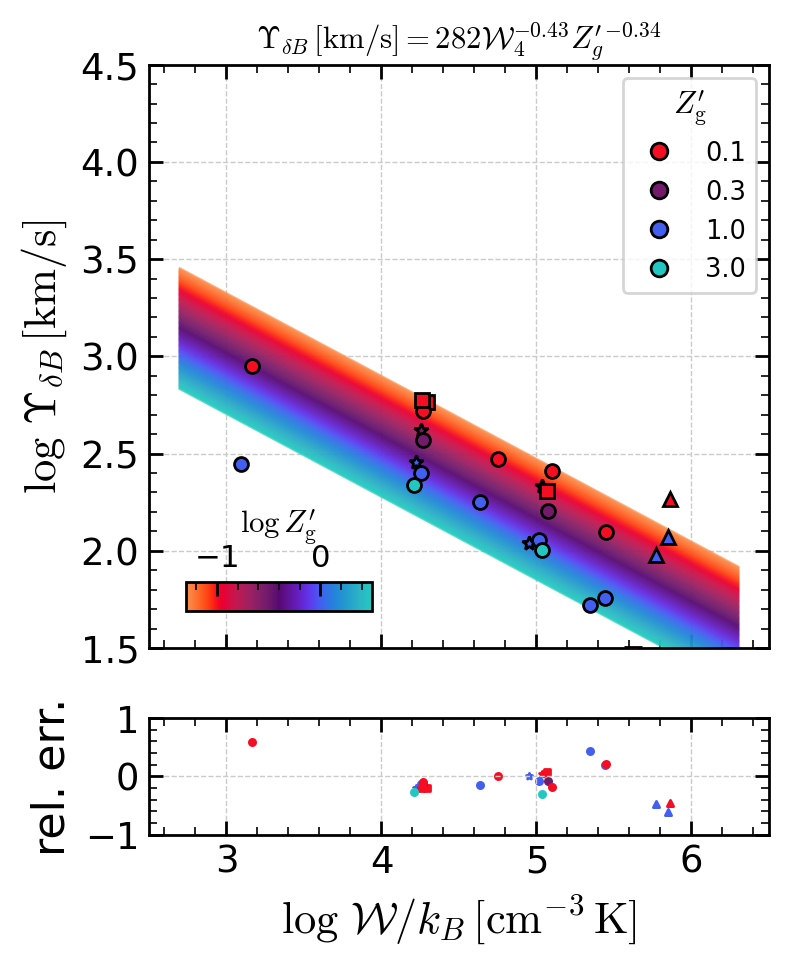

In [18]:
# Figure for feedback yields (each component saved into each figure)

for yf in ["Ytot", "Yth", "Yturb", "Ynonth", "Ymag", "oYmag", "dYmag"]:
    fig, axes = plt.subplots(
        2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
    )

    # set field names for x-axes and yaxis
    x1, x2 = ["W", "Zgas"]

    # linear regression
    odr_out = fit_odr(qdset, xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # plot simulation data along with fitting result
    plt.sca(axes[0])

    # write fitting result as the axis title
    a = odr_out.beta[1]
    b = odr_out.beta[2]
    Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
    tit = (
        labels[yf]
        + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
    )
    plt.title(tit, fontsize="x-small")

    # call plotting script
    if "nolegend" in outdir:
        plot_fitting_mean(qdset, model_dset, x1, yf, legend=0, colorbar=0, model=True)
    else:
        plot_fitting_mean(qdset, model_dset, x1, yf, legend=1, colorbar=3, model=True)
    # plot all data as grey dots
    # plt.plot(pt_df[x1],pt_df[yf],'.',color='grey',alpha=0.1,mew=0,zorder=-1)
    plt.ylim((1.5, 4.5))
    plt.xlabel("")

    # plot residual compared with the fitting result
    plt.sca(axes[1])
    print(yf)
    plot_fitting_mean(qdset, model_dset, x1, yf, residual=True, model=True)

    # decorate axis
    fig.axes[-1].xaxis.set_ticks_position("top")
    fig.axes[-1].xaxis.set_label_position("top")
    plt.setp(fig.axes[-1].get_xticklabels(), "fontsize", "x-small")
    fig.axes[-1].set_xlabel(fig.axes[-1].get_xlabel(), fontsize="x-small")

    # TIGRESS-classic
    if yf == "Ytot":
        plt.sca(axes[0])
        plt.plot(Wref, 3.86 - 0.212 * Wref, **ref_kwargs)
    elif yf == "Yth":
        plt.sca(axes[0])
        plt.plot(Wref, 4.45 - 0.506 * Wref, **ref_kwargs)
    elif yf == "Yturb":
        plt.sca(axes[0])
        plt.plot(Wref, 2.81 - 0.060 * Wref, **ref_kwargs)
    plt.xlim(Wref_min, Wref_max)
    # save figure
    plt.savefig(os.path.join(outdir, f"{yf}_fit.png"), bbox_inches="tight")

Beta: [ 4.73563414 -0.52081986 -0.61647401]
Beta Std Error: [0.14946952 0.03034287 0.04207222]
Beta Covariance: [[ 2.77137535 -0.55200579  0.14329928]
 [-0.55200579  0.11420978 -0.00925184]
 [ 0.14329928 -0.00925184  0.21957402]]
Residual Variance: 0.008061389626626938
Inverse Condition #: 0.0033153024808876353
Reason(s) for Halting:
  Sum of squares convergence
Beta: [ 4.32615861 -0.28321312 -0.27525972]
Beta Std Error: [0.22950318 0.04659449 0.06456667]
Beta Covariance: [[ 1.94145135 -0.38674385  0.09998464]
 [-0.38674385  0.08002362 -0.00641221]
 [ 0.09998464 -0.00641221  0.15366179]]
Residual Variance: 0.02713007039988386
Inverse Condition #: 0.003314757852471855
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.2874820262571336
L2 : 0.3935072799195625


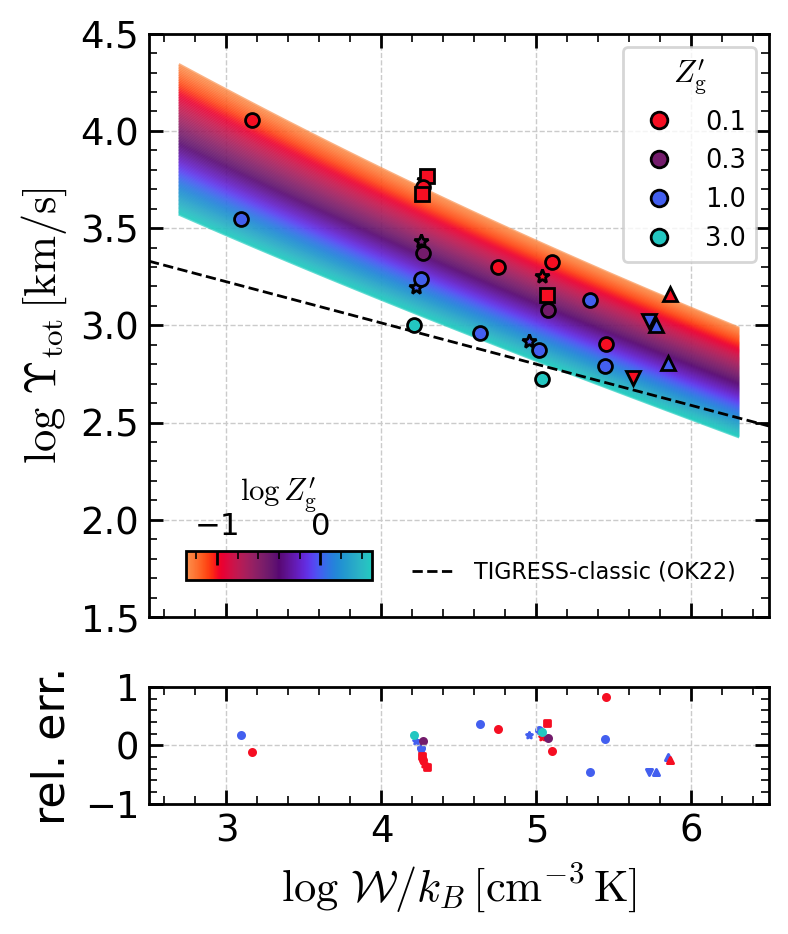

In [19]:
# Figure for total feedback yield compared with
# the model based on thermal + nonthermal (turbulent+magnetic)
fig, axes = plt.subplots(
    2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
)

x1, x2 = ["W", "Zgas"]

# fitting for thermal feedback yield
yf = "Yth"
odr_out = fit_odr(qdset, xf1=x1, xf2=x2, yf=yf)
# construct model (not the x1-axis is not W and the parameter range is changed)
model_dset1 = get_model_odr(
    odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
)

# fitting for non-thermal feedback yield
yf = "Ynonth"
odr_out = fit_odr(qdset, xf1=x1, xf2=x2, yf=yf)
# construct model (not the x1-axis is not W and the parameter range is changed)
model_dset2 = get_model_odr(
    odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
)

# get total feedback yield model by summing up two
model_dset = np.log10(10**model_dset1 + 10**model_dset2)

# plot results
plt.sca(axes[0])
plot_fitting_mean(qdset, model_dset, x1, "Ytot", legend=1, colorbar=3)
# plt.plot(pt_df[x1],pt_df['Ytot'],'.',color='grey',alpha=0.1,mew=0,zorder=-1)
# plt.ylim((5.e1,2.e4))
plt.ylim(1.5, 4.5)

plt.sca(axes[1])
plot_fitting_mean(qdset, model_dset, x1, "Ytot", residual=True)

axes[0].set_xlabel("")
fig.axes[-1].xaxis.set_ticks_position("top")
fig.axes[-1].xaxis.set_label_position("top")
plt.setp(fig.axes[-1].get_xticklabels(), "fontsize", "x-small")
fig.axes[-1].set_xlabel(fig.axes[-1].get_xlabel(), fontsize="x-small")


# add reference line from the previous result (Ostriker & Kim 2022 Eq 27, Figure 14)
plt.sca(axes[0])
plt.plot(Wref, 3.86 - 0.212 * Wref, **ref_kwargs)
leg1 = plt.gca().get_legend()
custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
leg2 = plt.legend(
    custom_lines2,
    ["TIGRESS-classic (OK22)"],
    loc=4,
    borderpad=1,
    fontsize=8,
    frameon=False,
)
plt.gca().add_artist(leg1)
plt.xlim(Wref_min, Wref_max)

plt.savefig(os.path.join(outdir, "Ytot_fit2.png"), bbox_inches="tight")

Beta: [ 4.36162515 -0.28597466 -0.26668585]
Beta Std Error: [0.16868482 0.03423901 0.04741157]
Beta Covariance: [[ 1.93481934 -0.38533693  0.10048952]
 [-0.38533693  0.07971328 -0.00659401]
 [ 0.10048952 -0.00659401  0.15284703]]
Residual Variance: 0.014706577162186573
Inverse Condition #: 0.003314172735584789
Reason(s) for Halting:
  Sum of squares convergence
Ytot
L1 : 0.22253116184539223
L2 : 0.3503531326609165
Beta: [ 4.42288057 -0.45791178 -0.52778774]
Beta Std Error: [0.11690866 0.02372874 0.03287182]
Beta Covariance: [[ 2.496694   -0.49721466  0.12989121]
 [-0.49721466  0.10285406 -0.00854011]
 [ 0.12989121 -0.00854011  0.19738736]]
Residual Variance: 0.005474292891641237
Inverse Condition #: 0.0033145671093999683
Reason(s) for Halting:
  Sum of squares convergence
Yth
L1 : 0.15445208317063905
L2 : 0.22874898515017458
Beta: [ 3.58292841 -0.20879555 -0.04472933]
Beta Std Error: [0.2067577  0.04195945 0.05802134]
Beta Covariance: [[ 1.75564237 -0.34960186  0.09176042]
 [-0.3496018

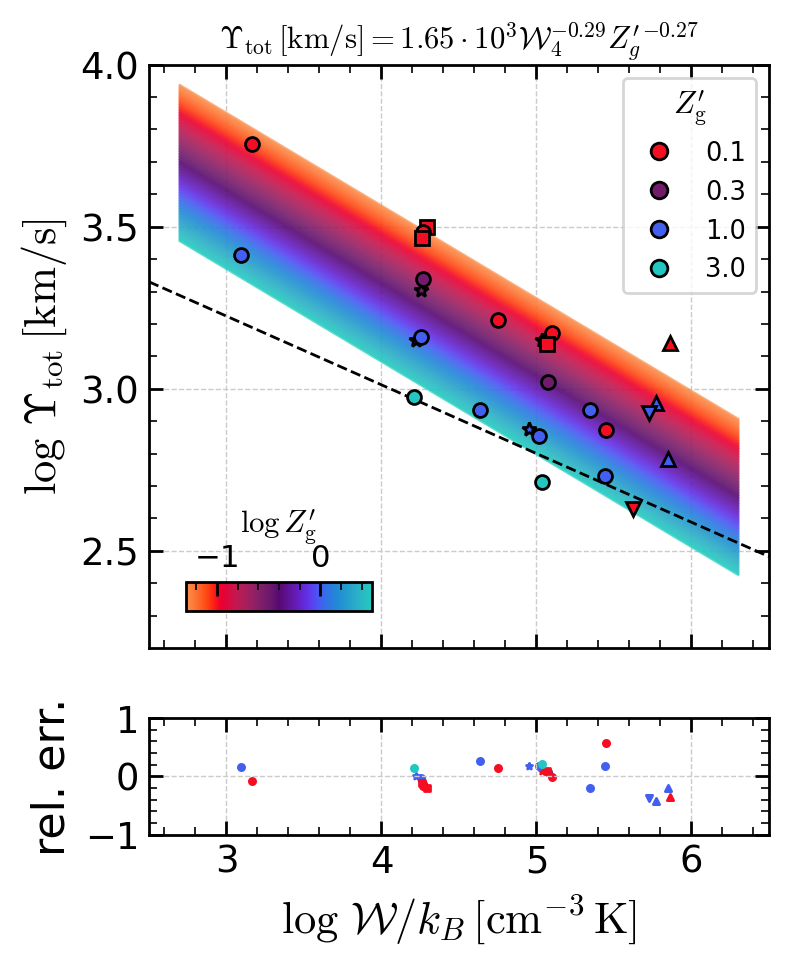

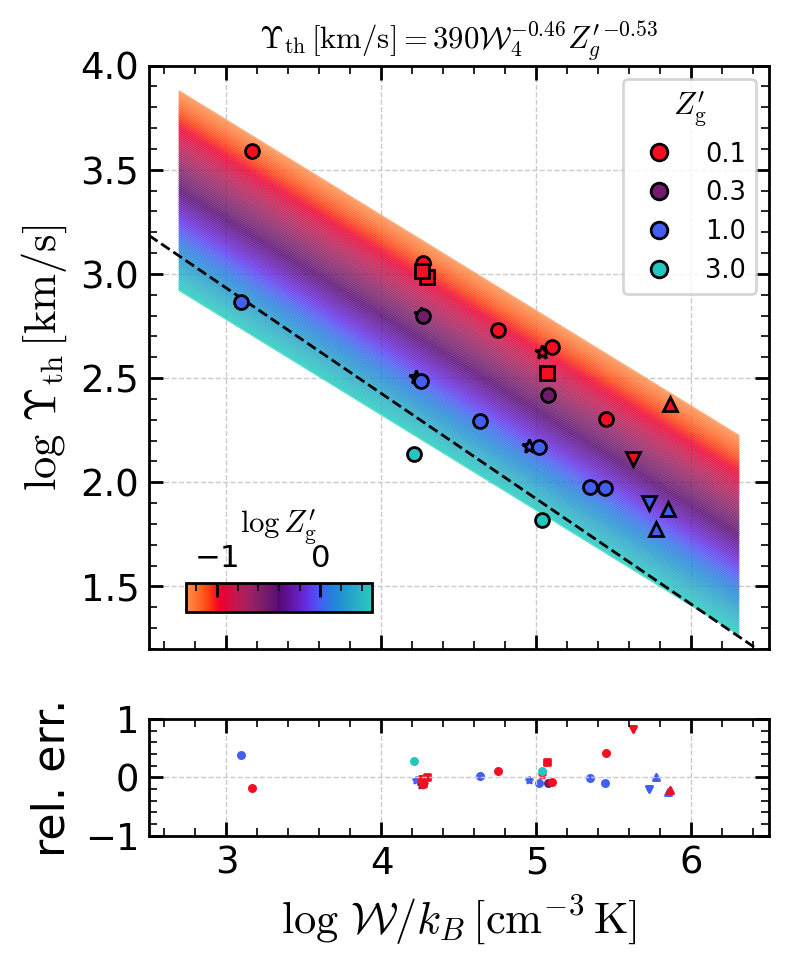

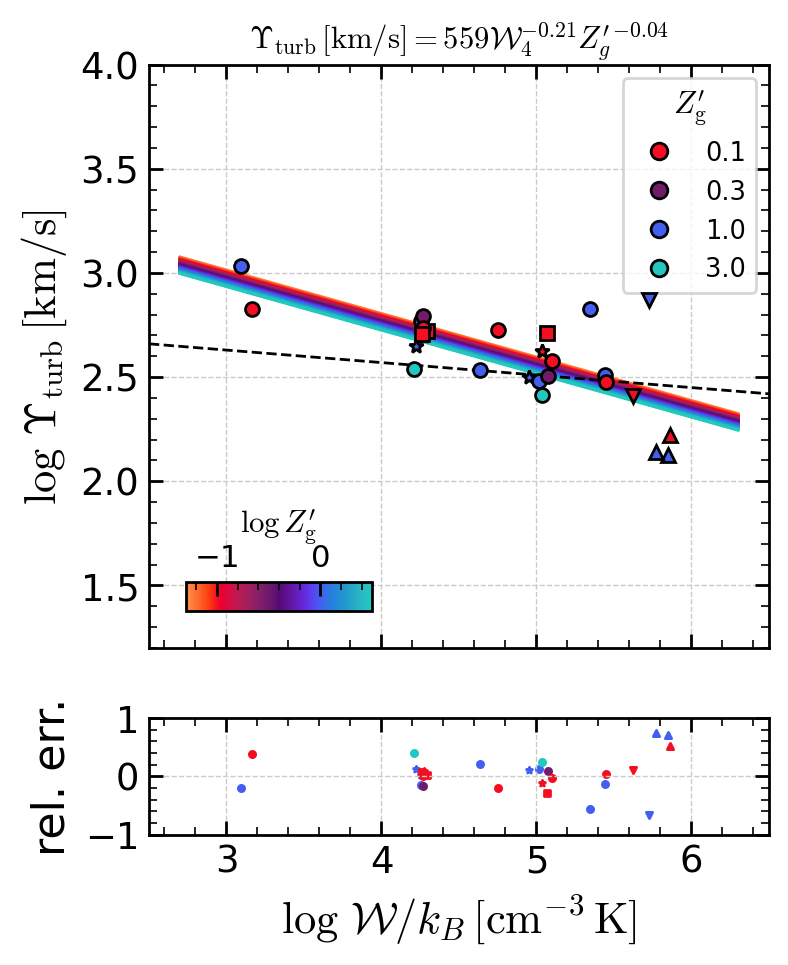

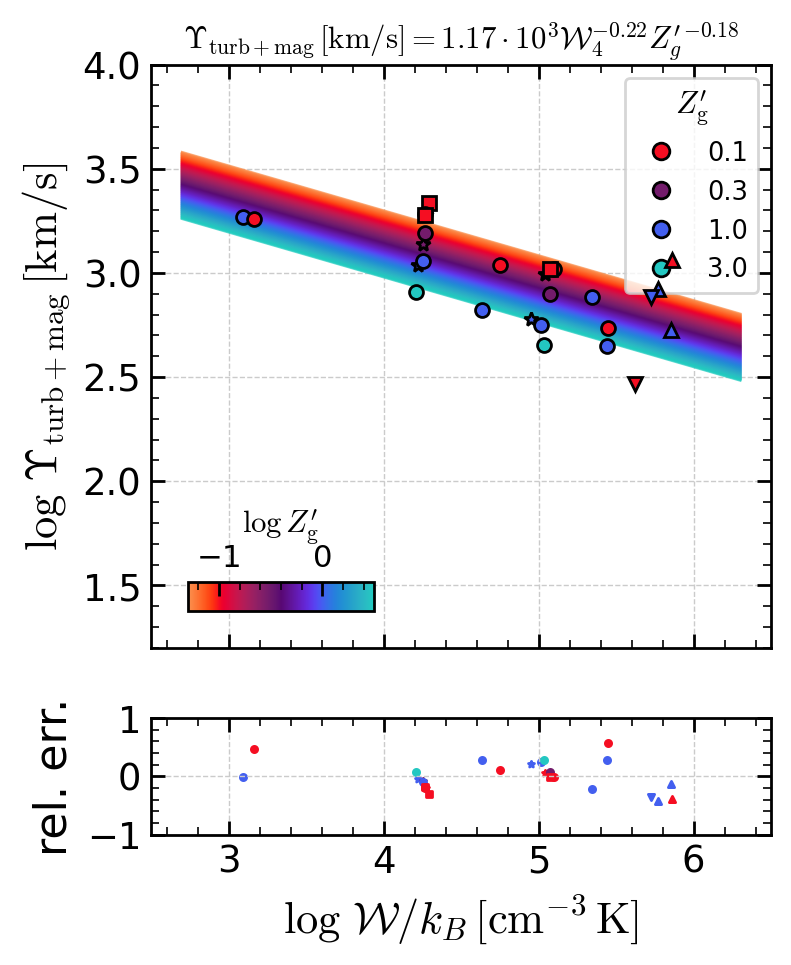

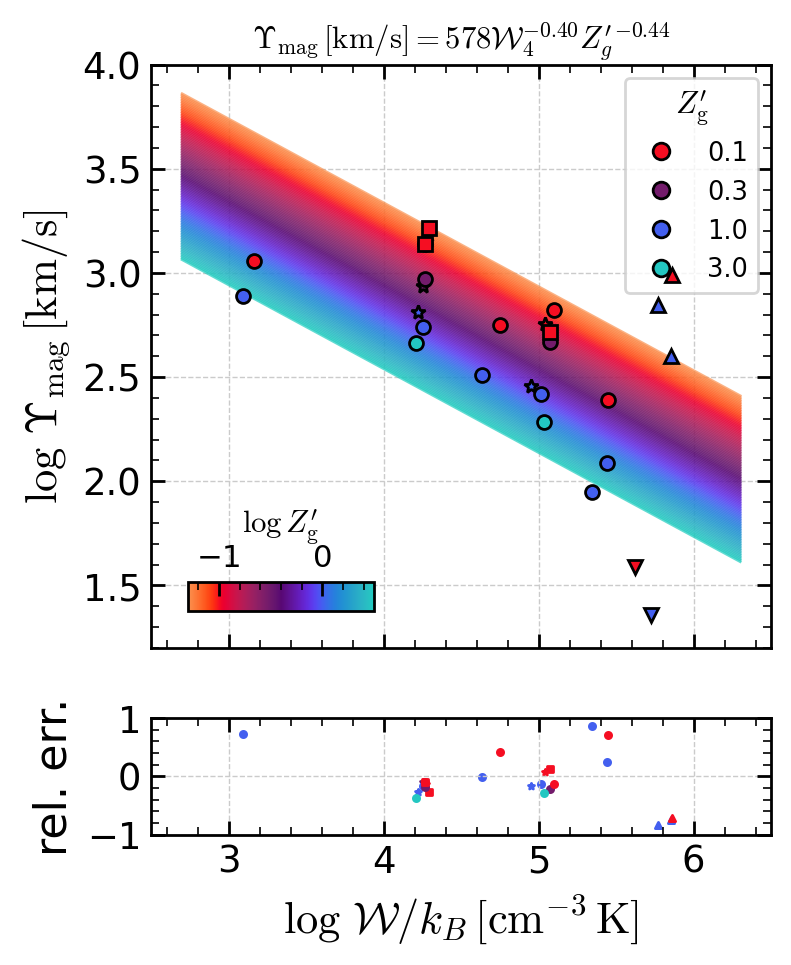

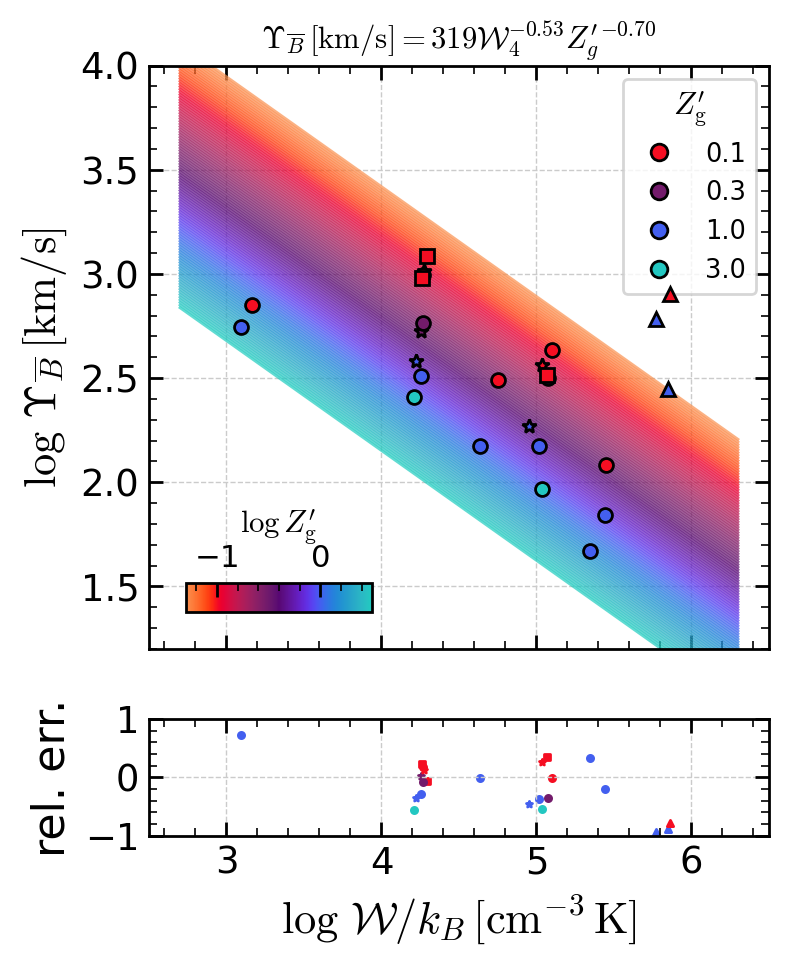

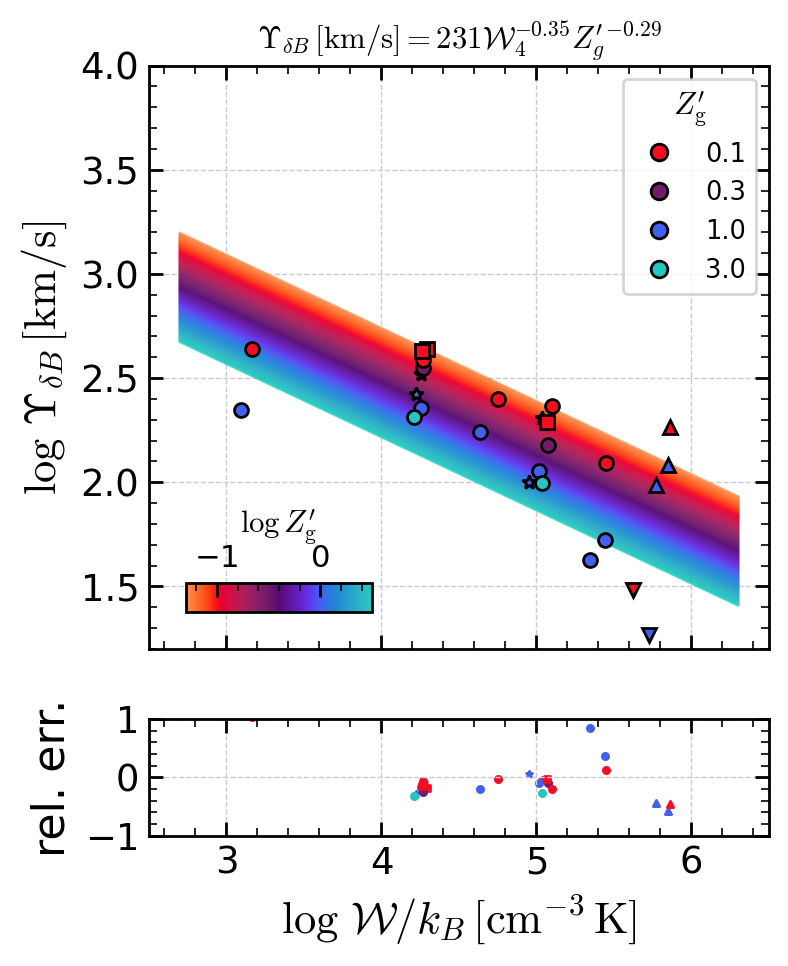

In [22]:
with plt.style.context({"savefig.bbox": "tight"}):
    # Figure for feedback yields (each component saved into each figure)
    for yf in ["Ytot", "Yth", "Yturb", "Ynonth", "Ymag", "oYmag", "dYmag"]:
        fig, axes = plt.subplots(
            2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
        )

        # set field names for x-axes and yaxis
        x1, x2 = ["W", "Zgas"]

        # linear regression
        odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
        # construct model (not the x1-axis is not W and the parameter range is changed)
        model_dset = get_model_odr(
            odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
        )

        # plot simulation data along with fitting result
        plt.sca(axes[0])

        # write fitting result as the axis title
        a = odr_out.beta[1]
        b = odr_out.beta[2]
        Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
        tit = (
            labels[yf]
            + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
        )
        plt.title(tit, fontsize="x-small")

        # call plotting script
        plot_fitting_mean(
            qdset_.to_array(), model_dset, x1, yf, legend=1, colorbar=3, model=True
        )
        # plot all data as grey dots
        # plt.plot(pt_df[x1],pt_df[yf],'.',color='grey',alpha=0.1,mew=0,zorder=-1)
        plt.ylim((1.2, 4.0))
        if yf == "Ytot":
            plt.ylim((2.2, 4.0))
        plt.xlabel("")

        # plot residual compared with the fitting result
        plt.sca(axes[1])
        print(yf)
        plot_fitting_mean(
            qdset_.to_array(), model_dset, x1, yf, residual=True, model=True
        )

        # decorate axis
        fig.axes[-1].xaxis.set_ticks_position("top")
        fig.axes[-1].xaxis.set_label_position("top")
        plt.setp(fig.axes[-1].get_xticklabels(), "fontsize", "x-small")
        fig.axes[-1].set_xlabel(fig.axes[-1].get_xlabel(), fontsize="x-small")

        # TIGRESS-classic
        if yf == "Ytot":
            plt.sca(axes[0])
            plt.plot(Wref, 3.86 - 0.212 * Wref, **ref_kwargs)
        elif yf == "Yth":
            plt.sca(axes[0])
            plt.plot(Wref, 4.45 - 0.506 * Wref, **ref_kwargs)
        elif yf == "Yturb":
            plt.sca(axes[0])
            plt.plot(Wref, 2.81 - 0.060 * Wref, **ref_kwargs)
        plt.xlim(Wref_min, Wref_max)
        # save figure
        plt.savefig(os.path.join(outdir, f"{yf}_mean_fit.png"), bbox_inches=None)

Beta: [ 4.36162515 -0.28597466 -0.26668585]
Beta Std Error: [0.16868482 0.03423901 0.04741157]
Beta Covariance: [[ 1.93481934 -0.38533693  0.10048952]
 [-0.38533693  0.07971328 -0.00659401]
 [ 0.10048952 -0.00659401  0.15284703]]
Residual Variance: 0.014706577162186573
Inverse Condition #: 0.003314172735584789
Reason(s) for Halting:
  Sum of squares convergence


Ytot
L1 : 0.22253116184539223
L2 : 0.3503531326609165
Beta: [ 4.42288057 -0.45791178 -0.52778774]
Beta Std Error: [0.11690866 0.02372874 0.03287182]
Beta Covariance: [[ 2.496694   -0.49721466  0.12989121]
 [-0.49721466  0.10285406 -0.00854011]
 [ 0.12989121 -0.00854011  0.19738736]]
Residual Variance: 0.005474292891641237
Inverse Condition #: 0.0033145671093999683
Reason(s) for Halting:
  Sum of squares convergence
Yth
L1 : 0.15445208317063905
L2 : 0.22874898515017458
Beta: [ 3.58292841 -0.20879555 -0.04472933]
Beta Std Error: [0.2067577  0.04195945 0.05802134]
Beta Covariance: [[ 1.75564237 -0.34960186  0.09176042]
 [-0.34960186  0.07230565 -0.00614447]
 [ 0.09176042 -0.00614447  0.13825734]]
Residual Variance: 0.024349347040047778
Inverse Condition #: 0.003311732909891769
Reason(s) for Halting:
  Sum of squares convergence
Yturb
L1 : 0.23320670452210573
L2 : 0.3170732196275784
Beta: [ 3.93086919 -0.21547451 -0.17701542]
Beta Std Error: [0.18654331 0.03786101 0.05240657]
Beta Covarian

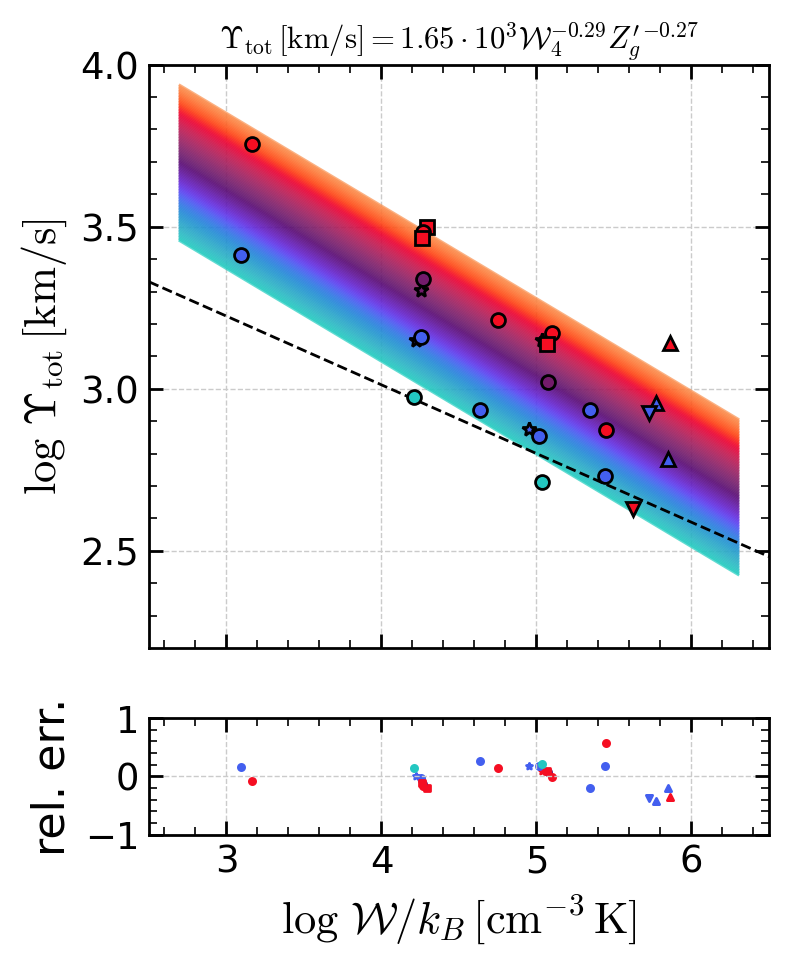

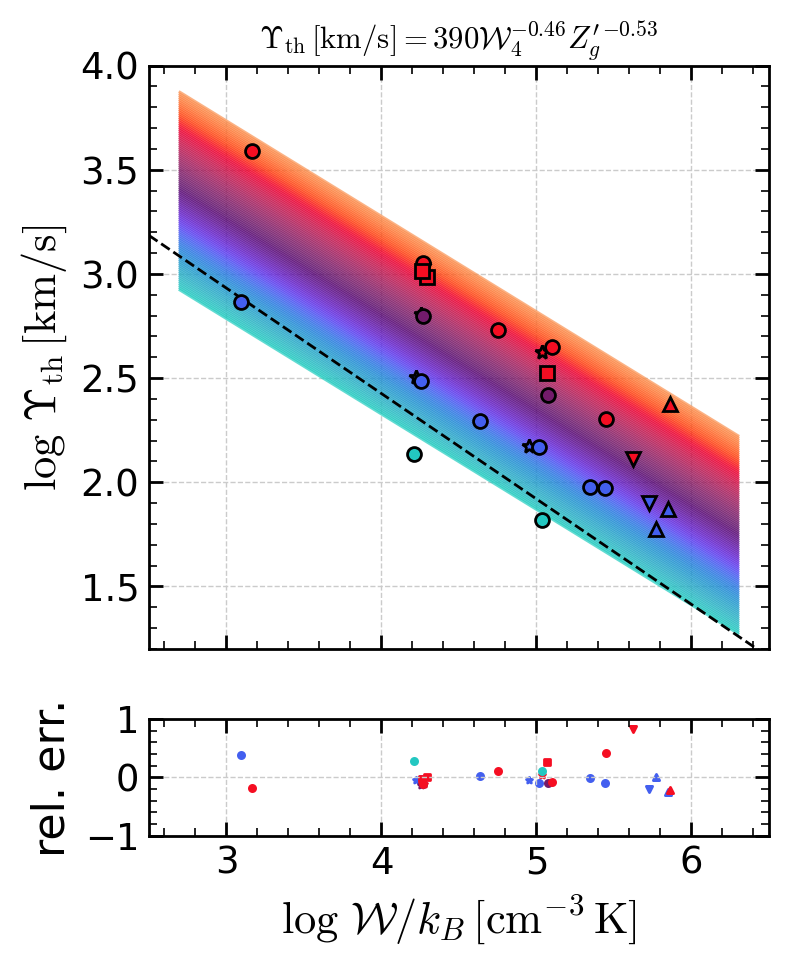

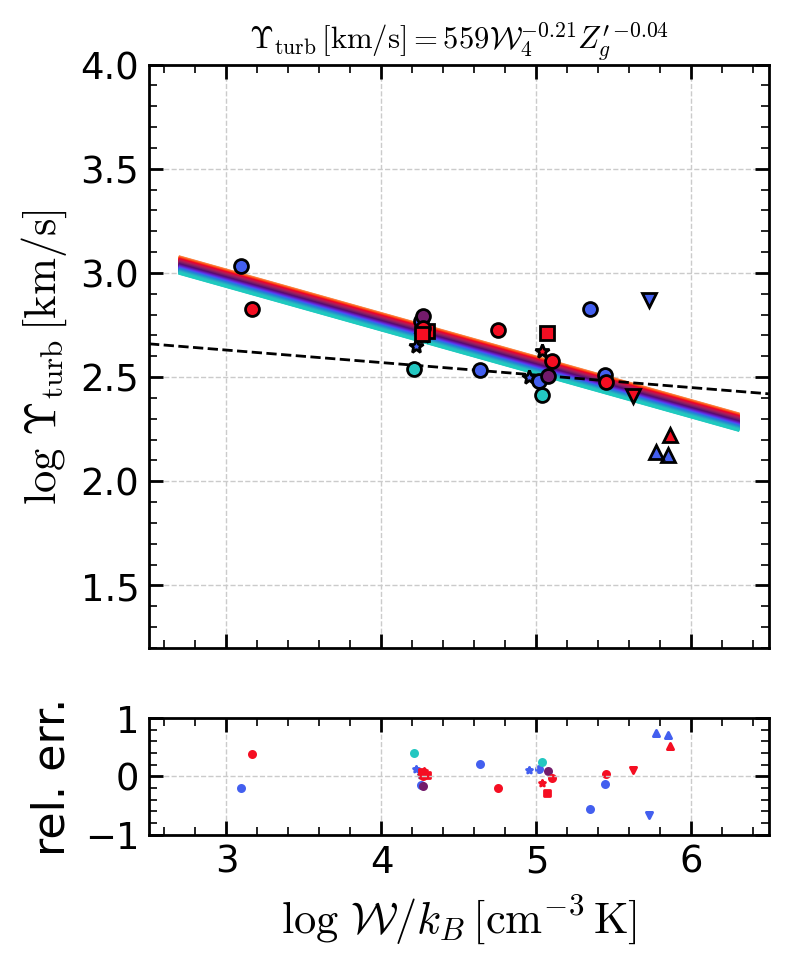

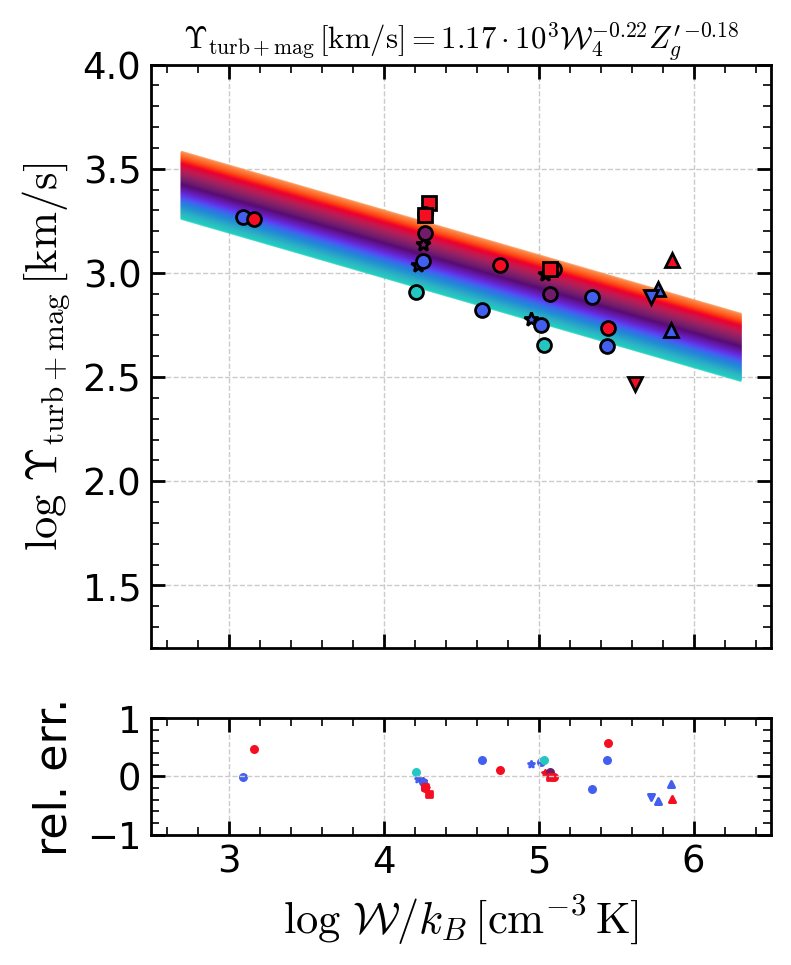

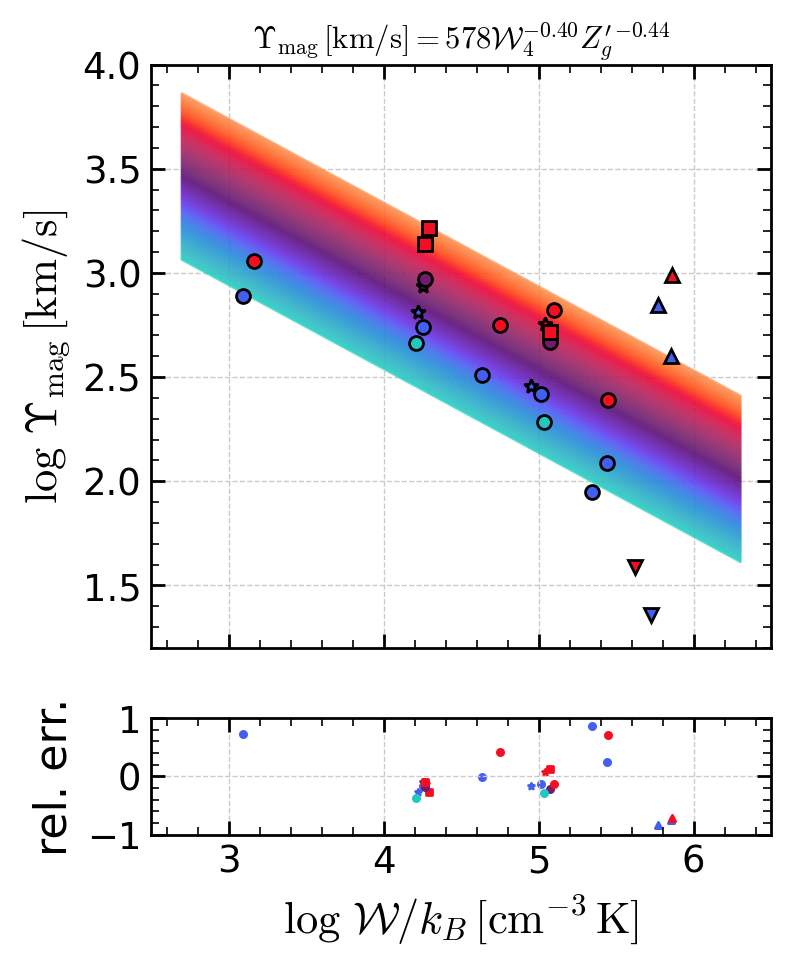

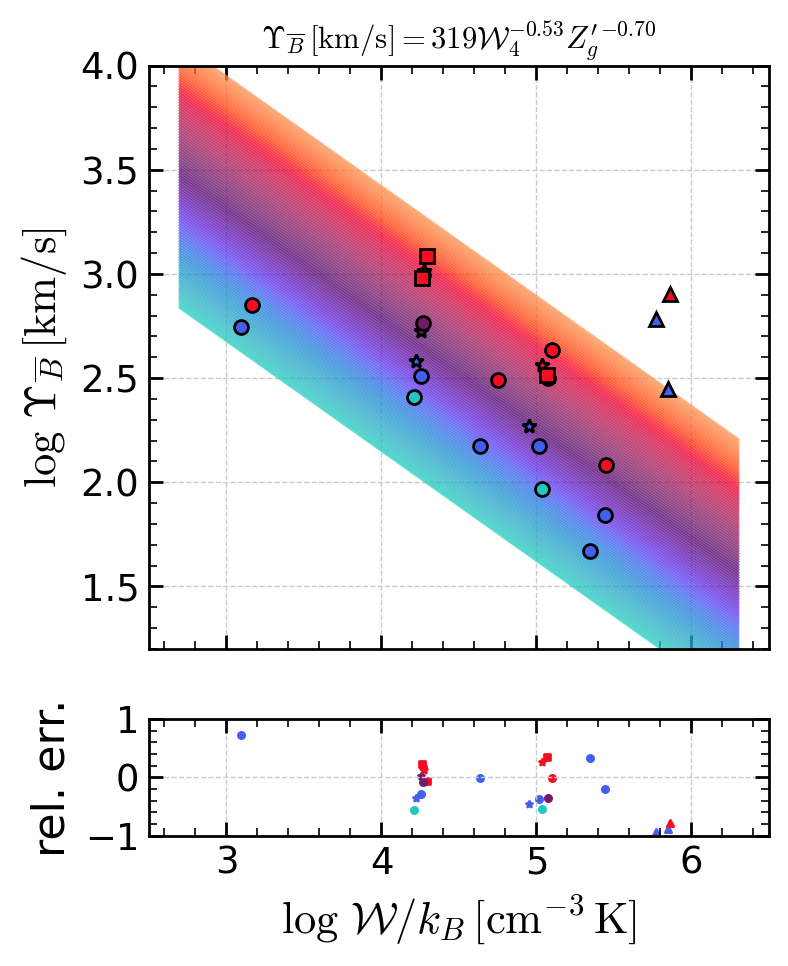

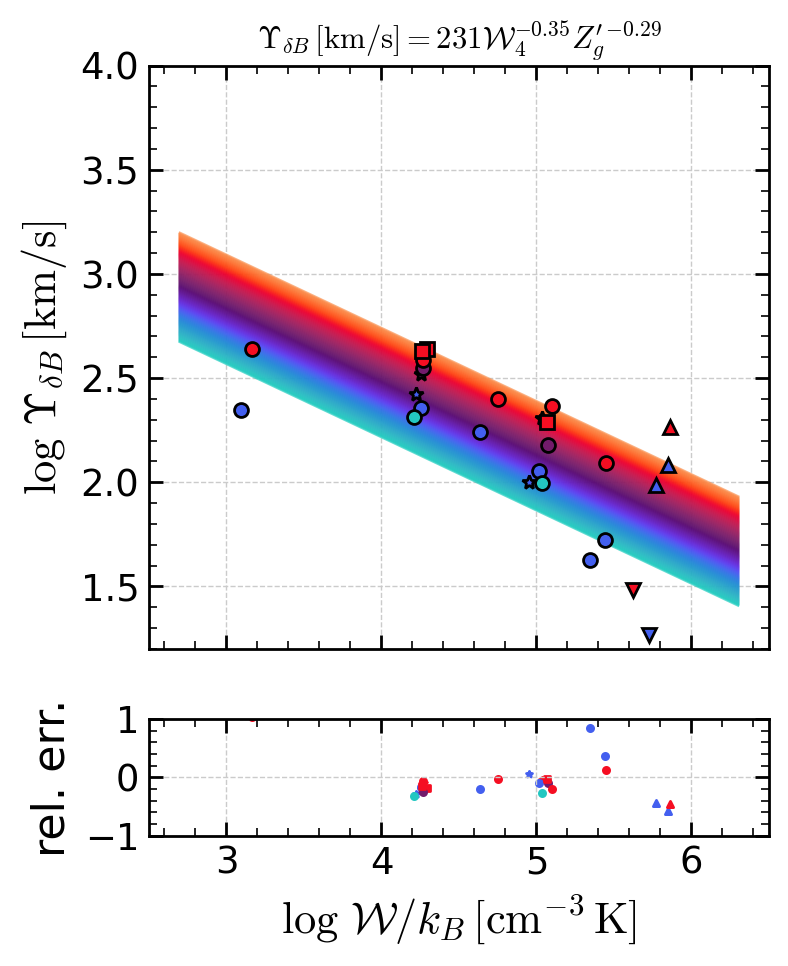

In [23]:
with plt.style.context({"savefig.bbox": "tight"}):
    # Figure for feedback yields (each component saved into each figure)
    for yf in ["Ytot", "Yth", "Yturb", "Ynonth", "Ymag", "oYmag", "dYmag"]:
        fig, axes = plt.subplots(
            2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
        )

        # set field names for x-axes and yaxis
        x1, x2 = ["W", "Zgas"]

        # linear regression
        odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
        # construct model (not the x1-axis is not W and the parameter range is changed)
        model_dset = get_model_odr(
            odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
        )

        # plot simulation data along with fitting result
        plt.sca(axes[0])

        # write fitting result as the axis title
        a = odr_out.beta[1]
        b = odr_out.beta[2]
        Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
        tit = (
            labels[yf]
            + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
        )
        plt.title(tit, fontsize="x-small")

        # call plotting script
        plot_fitting_mean(
            qdset_.to_array(), model_dset, x1, yf, legend=0, colorbar=0, model=True
        )
        plt.ylim((1.2, 4.0))
        if yf == "Ytot":
            plt.ylim((2.2, 4.0))
        plt.xlabel("")

        # plot residual compared with the fitting result
        plt.sca(axes[1])
        print(yf)
        plot_fitting_mean(
            qdset_.to_array(), model_dset, x1, yf, residual=True, model=True
        )

        # TIGRESS-classic
        if yf == "Ytot":
            plt.sca(axes[0])
            plt.plot(Wref, 3.86 - 0.212 * Wref, **ref_kwargs)
        elif yf == "Yth":
            plt.sca(axes[0])
            plt.plot(Wref, 4.45 - 0.506 * Wref, **ref_kwargs)
        elif yf == "Yturb":
            plt.sca(axes[0])
            plt.plot(Wref, 2.81 - 0.060 * Wref, **ref_kwargs)
        plt.xlim(Wref_min, Wref_max)
        # save figure
        plt.savefig(
            os.path.join(outdir, f"{yf}_mean_fit_nolegend.png"), bbox_inches=None
        )

Beta: [ 4.37225224 -0.40260582 -0.4422537 ]
Beta Std Error: [0.47212069 0.09614046 0.13485279]
Beta Covariance: [[ 2.29980849 -0.45942759  0.10554871]
 [-0.45942759  0.09536697 -0.00438177]
 [ 0.10554871 -0.00438177  0.18763138]]
Residual Variance: 0.09692022102830077
Inverse Condition #: 0.0033248154745300082
Reason(s) for Halting:
  Sum of squares convergence


Ymag
L1 : 0.7978661530262849
L2 : 1.8078771313171376


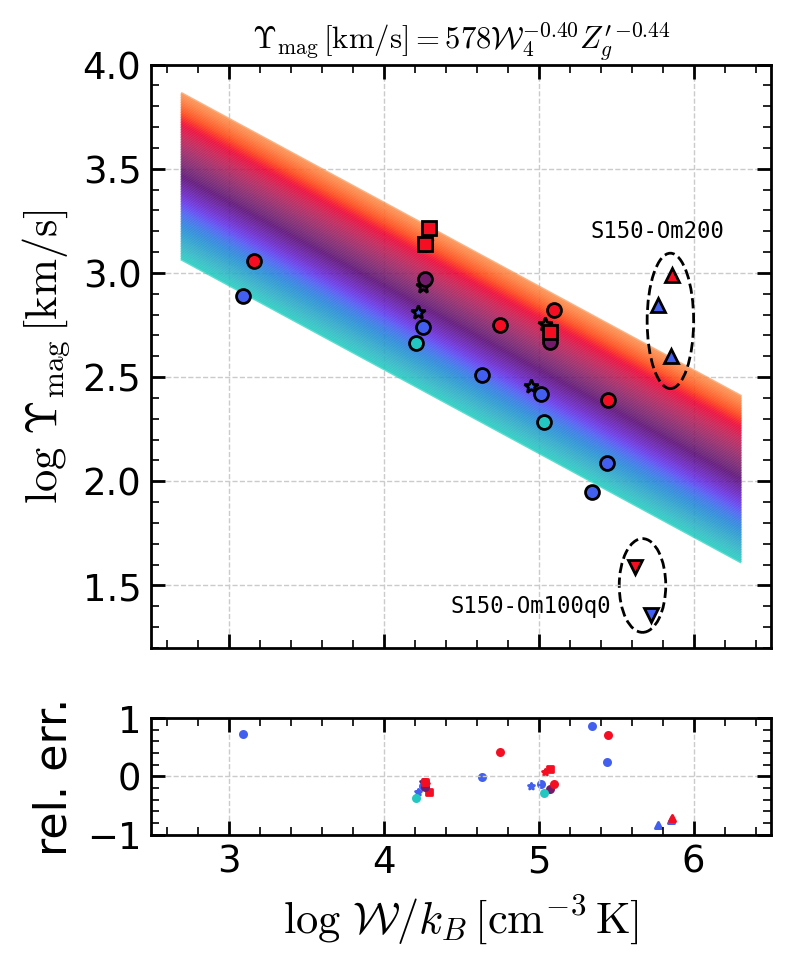

In [24]:
with plt.style.context({"savefig.bbox": "tight"}):
    # Figure for feedback yields (each component saved into each figure)
    yf = "Ymag"
    fig, axes = plt.subplots(
        2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
    )

    # set field names for x-axes and yaxis
    x1, x2 = ["W", "Zgas"]

    # linear regression
    odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # plot simulation data along with fitting result
    plt.sca(axes[0])

    # write fitting result as the axis title
    a = odr_out.beta[1]
    b = odr_out.beta[2]
    Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
    tit = (
        labels[yf]
        + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
    )
    plt.title(tit, fontsize="x-small")

    # call plotting script
    plot_fitting_mean(
        qdset_.to_array(), model_dset, x1, yf, legend=0, colorbar=0, model=True
    )
    plt.ylim((1.2, 4.0))
    if yf == "Ytot":
        plt.ylim((2.2, 4.0))
    plt.xlabel("")

    # two labels
    el = Ellipse((5.67, 1.5), 0.3, 0.45, ls="--", fc="none", color="k", lw=1)
    axes[0].add_artist(el)
    plt.annotate(
        "S150-Om100q0",
        (5.47, 1.4),
        family="monospace",
        fontsize=8,
        ha="right",
        va="center",
    )

    el = Ellipse(
        (5.85, 2.77), 0.3, 0.65, ls="--", fc="none", color="k", lw=1, zorder=20
    )
    axes[0].add_artist(el)
    plt.annotate(
        "S150-Om200",
        (6.2, 3.2),
        family="monospace",
        fontsize=8,
        ha="right",
        va="center",
    )
    # plot residual compared with the fitting result
    plt.sca(axes[1])
    print(yf)
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, yf, residual=True, model=True)

    # TIGRESS-classic
    if yf == "Ytot":
        plt.sca(axes[0])
        plt.plot(Wref, 3.86 - 0.212 * Wref, **ref_kwargs)
    elif yf == "Yth":
        plt.sca(axes[0])
        plt.plot(Wref, 4.45 - 0.506 * Wref, **ref_kwargs)
    elif yf == "Yturb":
        plt.sca(axes[0])
        plt.plot(Wref, 2.81 - 0.060 * Wref, **ref_kwargs)
    plt.xlim(Wref_min, Wref_max)
    # save figure
    plt.savefig(os.path.join(outdir, f"{yf}_mean_fit_nolegend.png"), bbox_inches=None)

Beta: [ 3.58292841 -0.20879555 -0.04472933]
Beta Std Error: [0.2067577  0.04195945 0.05802134]
Beta Covariance: [[ 1.75564237 -0.34960186  0.09176042]
 [-0.34960186  0.07230565 -0.00614447]
 [ 0.09176042 -0.00614447  0.13825734]]
Residual Variance: 0.024349347040047778
Inverse Condition #: 0.003311732909891769
Reason(s) for Halting:
  Sum of squares convergence


Yturb
L1 : 0.23320670452210573
L2 : 0.3170732196275784


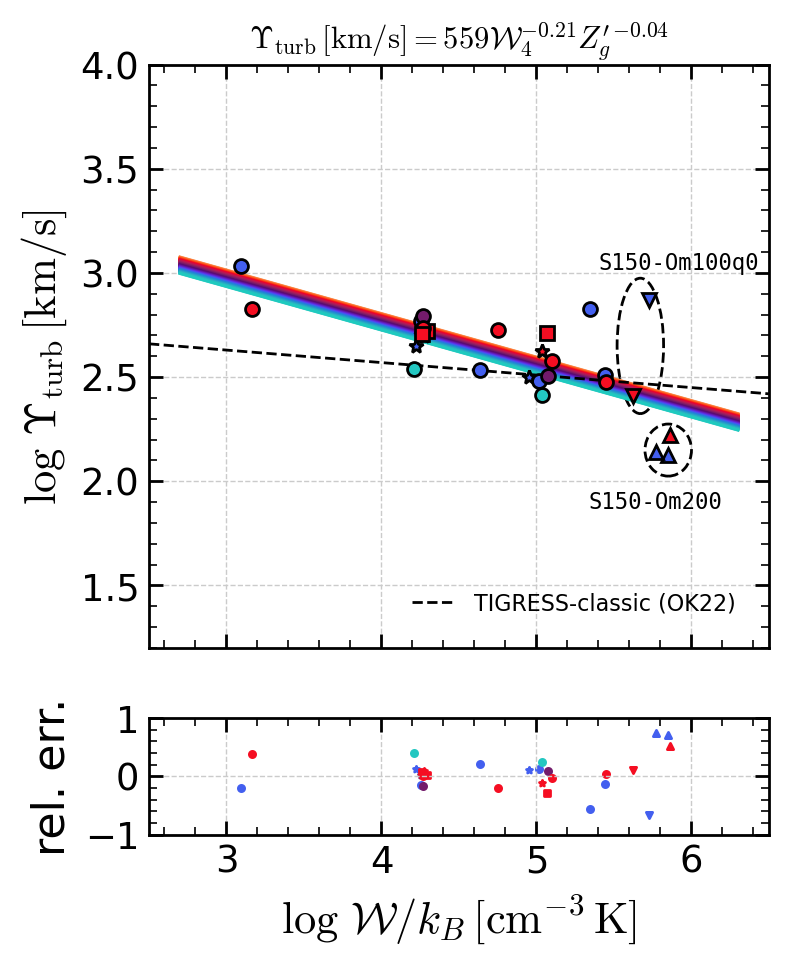

In [25]:
with plt.style.context({"savefig.bbox": "tight"}):
    # Figure for feedback yields (each component saved into each figure)
    yf = "Yturb"
    fig, axes = plt.subplots(
        2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
    )

    # set field names for x-axes and yaxis
    x1, x2 = ["W", "Zgas"]

    # linear regression
    odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # plot simulation data along with fitting result
    plt.sca(axes[0])

    # write fitting result as the axis title
    a = odr_out.beta[1]
    b = odr_out.beta[2]
    Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
    tit = (
        labels[yf]
        + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
    )
    plt.title(tit, fontsize="x-small")

    # call plotting script
    plot_fitting_mean(
        qdset_.to_array(), model_dset, x1, yf, legend=0, colorbar=0, model=True
    )
    plt.ylim((1.2, 4.0))
    if yf == "Ytot":
        plt.ylim((2.2, 4.0))
    plt.xlabel("")

    # two labels
    el = Ellipse((5.67, 2.65), 0.3, 0.65, ls="--", fc="none", color="k", lw=1)
    axes[0].add_artist(el)
    plt.annotate(
        "S150-Om100q0",
        (5.4, 3.05),
        family="monospace",
        fontsize=8,
        ha="left",
        va="center",
    )

    el = Ellipse(
        (5.85, 2.15), 0.3, 0.25, ls="--", fc="none", color="k", lw=1, zorder=20
    )
    axes[0].add_artist(el)
    plt.annotate(
        "S150-Om200",
        (6.2, 1.9),
        family="monospace",
        fontsize=8,
        ha="right",
        va="center",
    )
    # plot residual compared with the fitting result
    plt.sca(axes[1])
    print(yf)
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, yf, residual=True, model=True)

    # TIGRESS-classic
    if yf == "Ytot":
        plt.sca(axes[0])
        plt.plot(Wref, 3.86 - 0.212 * Wref, **ref_kwargs)
    elif yf == "Yth":
        plt.sca(axes[0])
        plt.plot(Wref, 4.45 - 0.506 * Wref, **ref_kwargs)
    elif yf == "Yturb":
        plt.sca(axes[0])
        plt.plot(Wref, 2.81 - 0.060 * Wref, **ref_kwargs)
    plt.xlim(Wref_min, Wref_max)
    custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
    leg2 = plt.legend(
        custom_lines2,
        ["TIGRESS-classic (OK22)"],
        loc=4,
        borderpad=1,
        fontsize=8,
        frameon=False,
    )
    # save figure
    plt.savefig(os.path.join(outdir, f"{yf}_mean_fit_nolegend.png"), bbox_inches=None)

Beta: [ 4.42288057 -0.45791178 -0.52778774]
Beta Std Error: [0.11690866 0.02372874 0.03287182]
Beta Covariance: [[ 2.496694   -0.49721466  0.12989121]
 [-0.49721466  0.10285406 -0.00854011]
 [ 0.12989121 -0.00854011  0.19738736]]
Residual Variance: 0.005474292891641237
Inverse Condition #: 0.0033145671093999683
Reason(s) for Halting:
  Sum of squares convergence
Beta: [ 3.93086919 -0.21547451 -0.17701542]
Beta Std Error: [0.18654331 0.03786101 0.05240657]
Beta Covariance: [[ 1.80847594 -0.36014991  0.09417515]
 [-0.36014991  0.07449684 -0.00622748]
 [ 0.09417515 -0.00622748  0.14273313]]
Residual Variance: 0.019241841400606797
Inverse Condition #: 0.003313781618644847
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.21380353270345848
L2 : 0.336167440397635


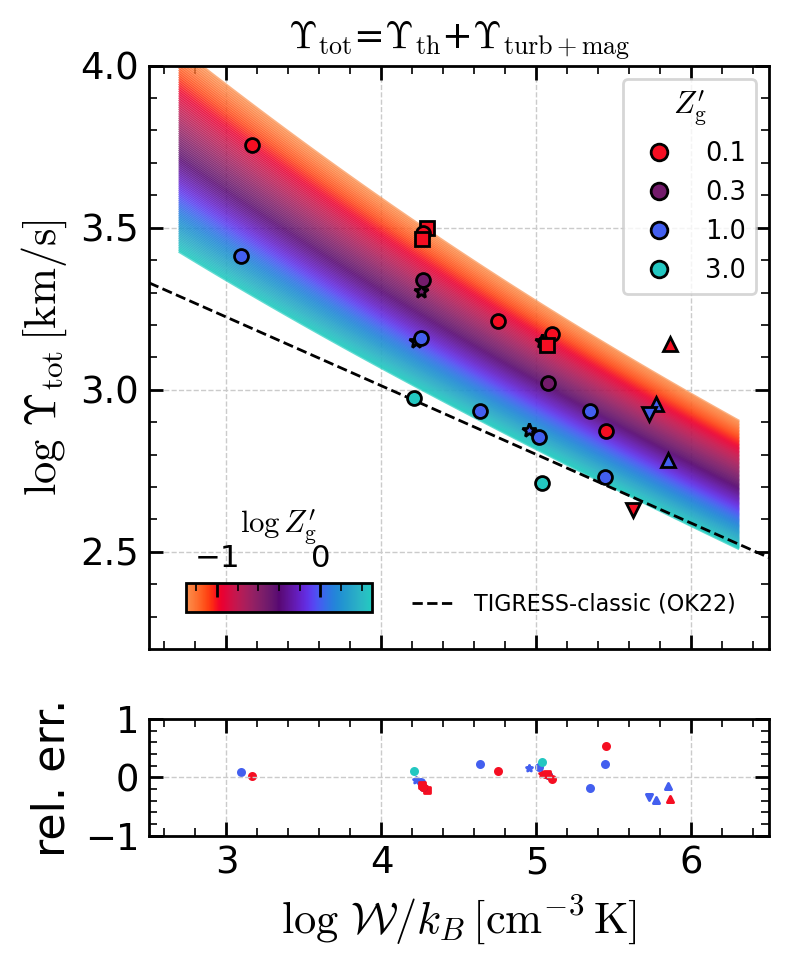

In [26]:
with plt.style.context({"savefig.bbox": "tight"}):
    # Figure for total feedback yield compared with
    # the model based on thermal + nonthermal (turbulent+magnetic)
    fig, axes = plt.subplots(
        2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
    )

    x1, x2 = ["W", "Zgas"]

    # fitting for thermal feedback yield
    yf = "Yth"
    odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset1 = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # fitting for non-thermal feedback yield
    yf = "Ynonth"
    odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset2 = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # get total feedback yield model by summing up two
    model_dset = np.log10(10**model_dset1 + 10**model_dset2)

    # plot results
    plt.sca(axes[0])
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, "Ytot", legend=1, colorbar=3)
    # plt.plot(pt_df[x1],pt_df['Ytot'],'.',color='grey',alpha=0.1,mew=0,zorder=-1)
    # plt.ylim((5.e1,2.e4))
    plt.ylim(2.2, 4.0)
    tit = (
        labels["Ytot"][:-16] + "=" + labels["Yth"][:-16] + "+" + labels["Ynonth"][:-16]
    )
    plt.title(tit, fontsize="small")

    plt.sca(axes[1])
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, "Ytot", residual=True)

    axes[0].set_xlabel("")
    fig.axes[-1].xaxis.set_ticks_position("top")
    fig.axes[-1].xaxis.set_label_position("top")
    plt.setp(fig.axes[-1].get_xticklabels(), "fontsize", "x-small")
    fig.axes[-1].set_xlabel(fig.axes[-1].get_xlabel(), fontsize="x-small")

    # add reference line from the previous result (Ostriker & Kim 2022 Eq 27, Figure 14)
    plt.sca(axes[0])
    plt.plot(Wref, 3.86 - 0.212 * Wref, **ref_kwargs)
    plt.xlim(Wref_min, Wref_max)
    leg1 = plt.gca().get_legend()
    custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
    leg2 = plt.legend(
        custom_lines2,
        ["TIGRESS-classic (OK22)"],
        loc=4,
        borderpad=1,
        fontsize=8,
        frameon=False,
    )
    plt.gca().add_artist(leg1)

    plt.savefig(os.path.join(outdir, "Ytot_mean_fit2.png"), bbox_inches=None)

Beta: [ 4.42288057 -0.45791178 -0.52778774]
Beta Std Error: [0.11690866 0.02372874 0.03287182]
Beta Covariance: [[ 2.496694   -0.49721466  0.12989121]
 [-0.49721466  0.10285406 -0.00854011]
 [ 0.12989121 -0.00854011  0.19738736]]
Residual Variance: 0.005474292891641237
Inverse Condition #: 0.0033145671093999683
Reason(s) for Halting:
  Sum of squares convergence
Beta: [ 3.93086919 -0.21547451 -0.17701542]
Beta Std Error: [0.18654331 0.03786101 0.05240657]
Beta Covariance: [[ 1.80847594 -0.36014991  0.09417515]
 [-0.36014991  0.07449684 -0.00622748]
 [ 0.09417515 -0.00622748  0.14273313]]
Residual Variance: 0.019241841400606797
Inverse Condition #: 0.003313781618644847
Reason(s) for Halting:
  Sum of squares convergence


L1 : 0.21380353270345848
L2 : 0.336167440397635


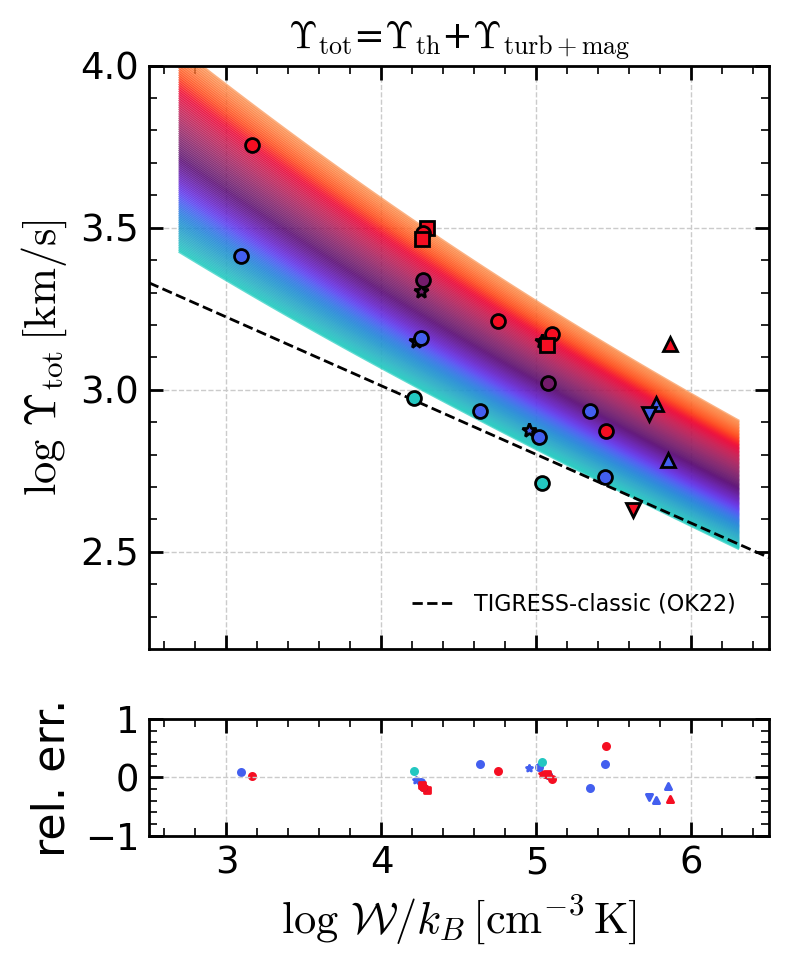

In [27]:
with plt.style.context({"savefig.bbox": "tight"}):
    # Figure for total feedback yield compared with
    # the model based on thermal + nonthermal (turbulent+magnetic)
    fig, axes = plt.subplots(
        2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
    )

    x1, x2 = ["W", "Zgas"]

    # fitting for thermal feedback yield
    yf = "Yth"
    odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset1 = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # fitting for non-thermal feedback yield
    yf = "Ynonth"
    odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset2 = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # get total feedback yield model by summing up two
    model_dset = np.log10(10**model_dset1 + 10**model_dset2)

    # plot results
    plt.sca(axes[0])
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, "Ytot", legend=0, colorbar=0)
    plt.ylim(2.2, 4.0)
    tit = (
        labels["Ytot"][:-16] + "=" + labels["Yth"][:-16] + "+" + labels["Ynonth"][:-16]
    )
    plt.title(tit, fontsize="small")

    plt.sca(axes[1])
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, "Ytot", residual=True)

    axes[0].set_xlabel("")

    # add reference line from the previous result (Ostriker & Kim 2022 Eq 27, Figure 14)
    plt.sca(axes[0])
    plt.plot(Wref, 3.86 - 0.212 * Wref, **ref_kwargs)
    plt.xlim(Wref_min, Wref_max)
    custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
    leg2 = plt.legend(
        custom_lines2,
        ["TIGRESS-classic (OK22)"],
        loc=4,
        borderpad=1,
        fontsize=8,
        frameon=False,
    )

    plt.savefig(os.path.join(outdir, "Ytot_mean_fit2_nolegend.png"), bbox_inches=None)

Beta: [-8.19897368  1.3313466   0.30117841]
Beta Std Error: [0.19022054 0.03861682 0.053249  ]
Beta Covariance: [[ 4.83332298 -0.96289051  0.24926843]
 [-0.96289051  0.19919753 -0.01639328]
 [ 0.24926843 -0.01639328  0.37875117]]
Residual Variance: 0.007486330475950585
Inverse Condition #: 0.003304831912472553
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.22091822781118992
L2 : 0.3589250913933103


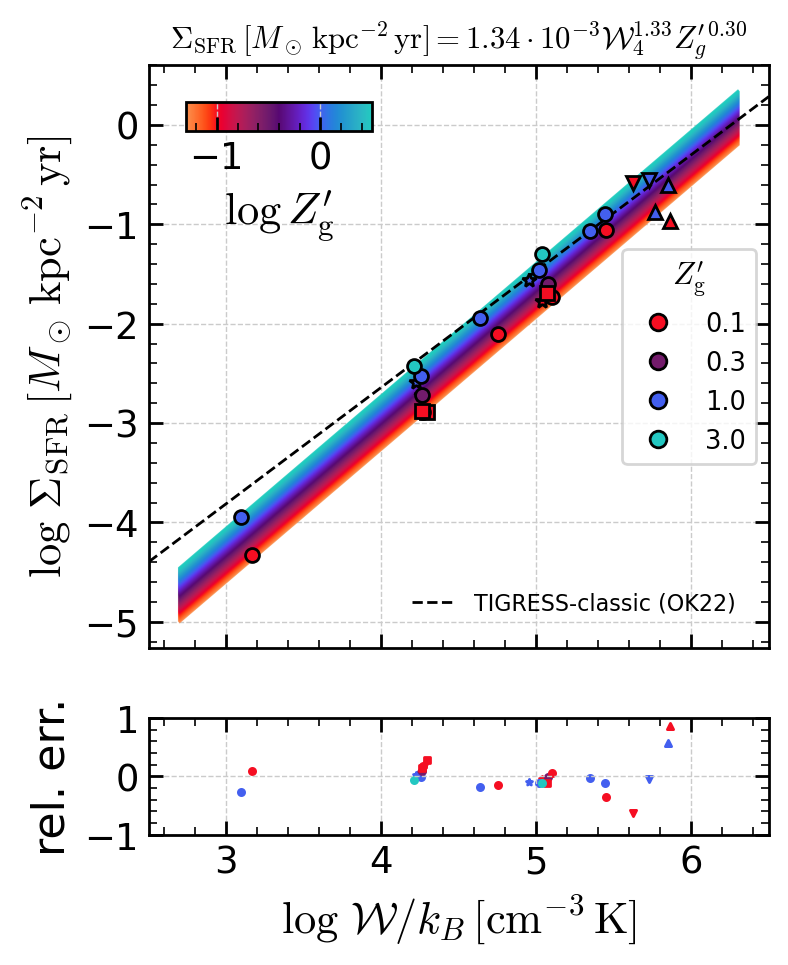

In [28]:
with plt.style.context({"savefig.bbox": "tight"}):
    # Figure for total feedback yield compared with
    # the model based on thermal + nonthermal (turbulent+magnetic)
    fig, axes = plt.subplots(
        2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
    )

    x1, x2 = ["W", "Zgas"]

    # fitting for thermal feedback yield
    yf = "sfr"
    odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # plot results
    plt.sca(axes[0])
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, yf, legend=5, colorbar=2)
    # plt.ylim(2.2, 4.0)

    # write fitting result as the axis title
    a = odr_out.beta[1]
    b = odr_out.beta[2]
    Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
    tit = (
        labels[yf]
        + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
    )
    plt.title(tit, fontsize="x-small")

    plt.sca(axes[1])
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, yf, residual=True)

    axes[0].set_xlabel("")

    # add reference line from the previous result (Ostriker & Kim 2022 Eq 27, Figure 14)
    plt.sca(axes[0])
    plt.plot(Wref, 1.17 * Wref - 7.32, **ref_kwargs)
    plt.xlim(Wref_min, Wref_max)
    leg1 = plt.gca().get_legend()
    custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
    leg2 = plt.legend(
        custom_lines2,
        ["TIGRESS-classic (OK22)"],
        loc=4,
        borderpad=1,
        fontsize=8,
        frameon=False,
    )
    plt.gca().add_artist(leg1)

    plt.savefig(os.path.join(outdir, "Ssfr_W.png"), bbox_inches=None)

Beta: [ 7.23979523 -0.83442374 -0.43209225]
Beta Std Error: [0.24423278 0.04961842 0.06846647]
Beta Covariance: [[ 3.18445219 -0.63486574  0.15959787]
 [-0.63486574  0.1314355  -0.00976782]
 [ 0.15959787 -0.00976782  0.25025495]]
Residual Variance: 0.0187315266021954
Inverse Condition #: 0.0033074060242867798
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.31602649490559864
L2 : 0.4911062733444835


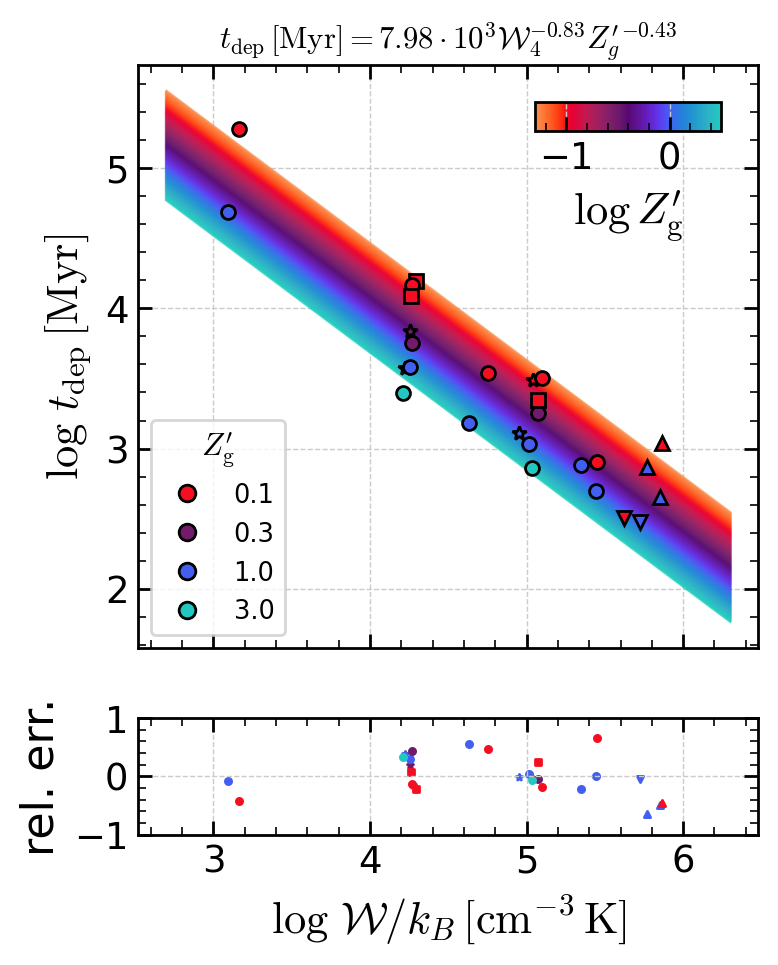

In [36]:
with plt.style.context({"savefig.bbox": "tight"}):
    # Figure for total feedback yield compared with
    # the model based on thermal + nonthermal (turbulent+magnetic)
    fig, axes = plt.subplots(
        2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
    )

    x1, x2 = ["W", "Zgas"]

    # fitting for thermal feedback yield
    yf = "tdep"
    odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # plot results
    plt.sca(axes[0])
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, yf, legend=3, colorbar=1)
    # plt.ylim(2.2, 4.0)

    # write fitting result as the axis title
    a = odr_out.beta[1]
    b = odr_out.beta[2]
    Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
    tit = (
        labels[yf]
        + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
    )
    plt.title(tit, fontsize="x-small")

    plt.sca(axes[1])
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, yf, residual=True)

    axes[0].set_xlabel("")

    # add reference line from the previous result (Ostriker & Kim 2022 Eq 27, Figure 14)
    # plt.sca(axes[0])
    # plt.plot(Wref, 1.17 * Wref - 7.32, **ref_kwargs)
    # plt.xlim(Wref_min, Wref_max)
    # leg1 = plt.gca().get_legend()
    # custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
    # leg2 = plt.legend(
    #     custom_lines2,
    #     ["TIGRESS-classic (OK22)"],
    #     loc=4,
    #     borderpad=1,
    #     fontsize=8,
    #     frameon=False,
    # )
    # plt.gca().add_artist(leg1)

    plt.savefig(os.path.join(outdir, "tdep_W.png"), bbox_inches=None)

Beta: [-0.85410391  3.43485798 -0.49971836]
Beta Std Error: [0.55457697 0.45918396 0.15577819]
Beta Covariance: [[ 21.80662085 -17.71499146   0.88100892]
 [-17.71499146  14.94989411  -0.08953895]
 [  0.88100892  -0.08953895   1.72059242]]
Residual Variance: 0.014103772448204625
Inverse Condition #: 0.01288805139741615
Reason(s) for Halting:
  Sum of squares convergence
L1 : 1.0438674797014367
L2 : 1.6765977975053703


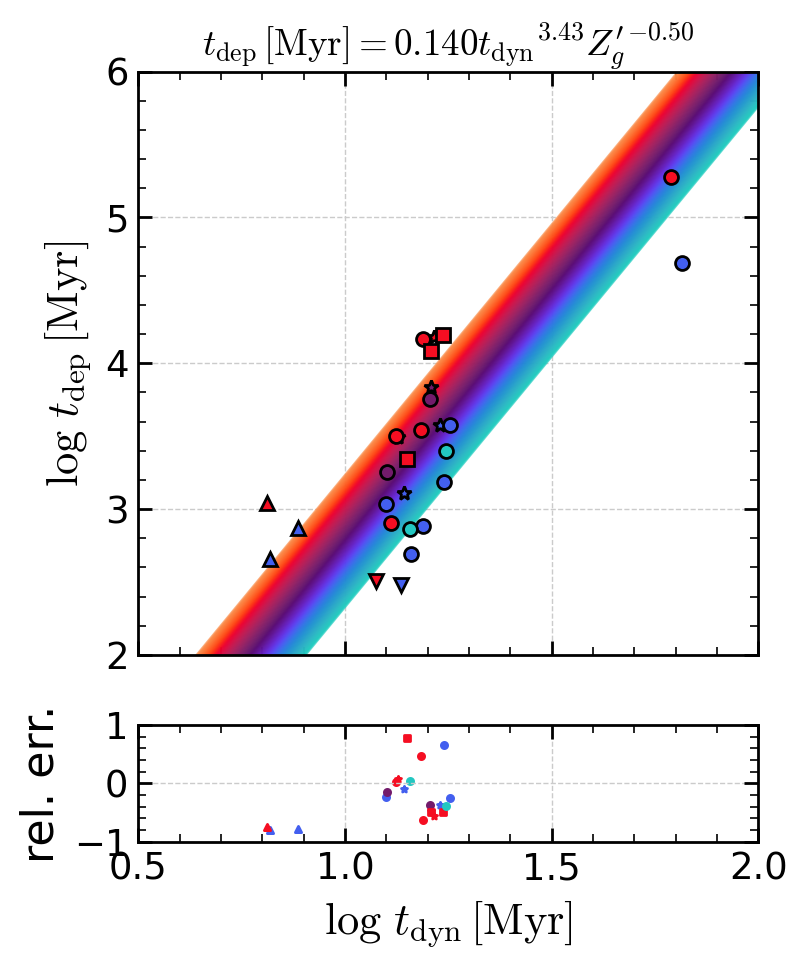

In [20]:
with plt.style.context({"savefig.bbox": "tight"}):
    # Figure for total feedback yield compared with
    # the model based on thermal + nonthermal (turbulent+magnetic)
    fig, axes = plt.subplots(
        2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
    )

    x1, x2 = ["tdyn", "Zgas"]

    # fitting for thermal feedback yield
    yf = "tdep"
    odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=0, Wmax=2, dims=[x2, x1]
    )

    # plot results
    plt.sca(axes[0])
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, yf, legend=0, colorbar=0)
    plt.ylim(2., 6.0)
    plt.xlim(0.5, 2.0)

    # write fitting result as the axis title
    a = odr_out.beta[1]
    b = odr_out.beta[2]
    Y0 = 10 ** odr_out.beta[0]
    tit = (
        labels[yf]
        + f"$={scifmt(Y0)} {{t_{{\\rm dyn}}}}^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
    )
    plt.title(tit, fontsize="small")

    plt.sca(axes[1])
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, yf, residual=True)

    axes[0].set_xlabel("")

    # add reference line from the previous result (Ostriker & Kim 2022 Eq 27, Figure 14)
    # plt.sca(axes[0])
    # plt.plot(Wref, 1.17 * Wref - 7.32, **ref_kwargs)
    # plt.xlim(Wref_min, Wref_max)
    # leg1 = plt.gca().get_legend()
    # custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
    # leg2 = plt.legend(
    #     custom_lines2,
    #     ["TIGRESS-classic (OK22)"],
    #     loc=4,
    #     borderpad=1,
    #     fontsize=8,
    #     frameon=False,
    # )
    # plt.gca().add_artist(leg1)

    plt.savefig(os.path.join(outdir, "tdep_tdyn.png"), bbox_inches=None)

Beta: [-4.1822227   0.52751296  0.39750893]
Beta Std Error: [0.28823347 0.05857592 0.08110377]
Beta Covariance: [[ 2.42546861 -0.48366366  0.12019281]
 [-0.48366366  0.10017169 -0.00702069]
 [ 0.12019281 -0.00702069  0.19203876]]
Residual Variance: 0.034252570172324644
Inverse Condition #: 0.0033128006686510706
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.3701956740649215
L2 : 0.6521474005158726


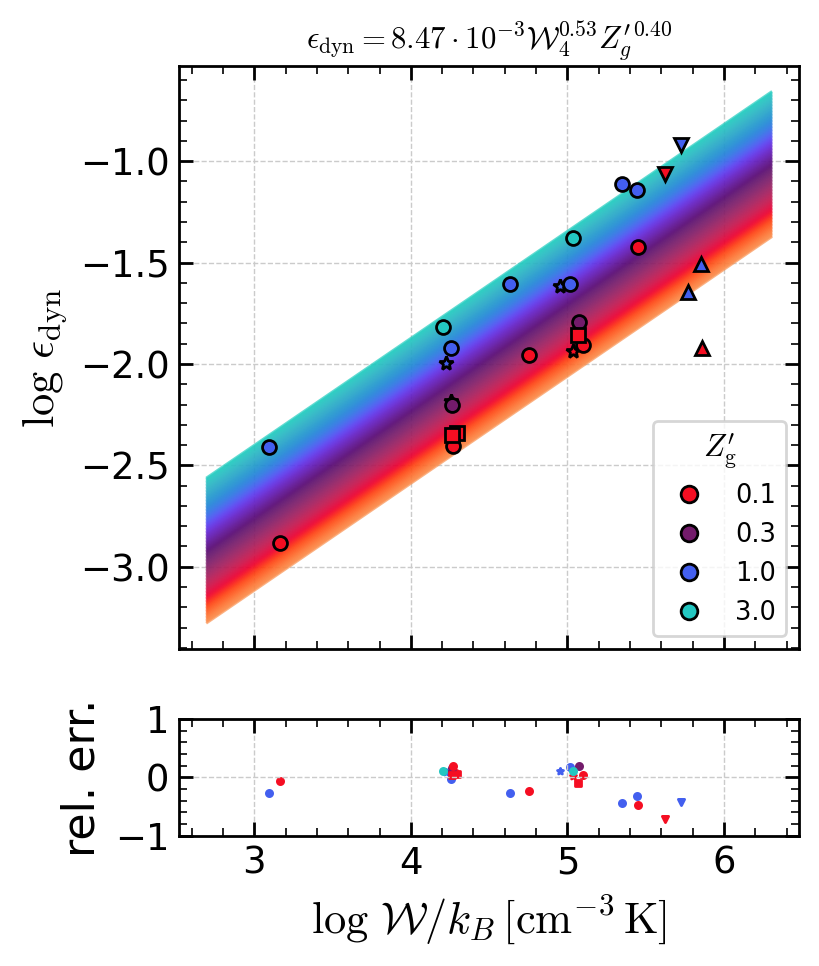

In [18]:
with plt.style.context({"savefig.bbox": "tight"}):
    # Figure for total feedback yield compared with
    # the model based on thermal + nonthermal (turbulent+magnetic)
    fig, axes = plt.subplots(
        2, 1, sharex="col", figsize=(4, 5), gridspec_kw=dict(height_ratios=[1, 0.2])
    )

    x1, x2 = ["W", "Zgas"]

    # fitting for thermal feedback yield
    yf = "edyn"
    odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # plot results
    plt.sca(axes[0])
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, yf)
    # plt.ylim(2., 6.0)
    # plt.xlim(0.5, 2.0)

    # write fitting result as the axis title
    a = odr_out.beta[1]
    b = odr_out.beta[2]
    Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
    tit = (
        labels[yf]
        + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
    )
    plt.title(tit, fontsize="x-small")

    plt.sca(axes[1])
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, yf, residual=True)

    axes[0].set_xlabel("")

    # add reference line from the previous result (Ostriker & Kim 2022 Eq 27, Figure 14)
    if yf == "sfr":
        plt.sca(axes[0])
        plt.plot(Wref, 1.17 * Wref - 7.32, **ref_kwargs)
        plt.xlim(Wref_min, Wref_max)
        # leg1 = plt.gca().get_legend()
        custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
        leg2 = plt.legend(
            custom_lines2,
            ["TIGRESS-classic (OK22)"],
            loc=4,
            borderpad=1,
            fontsize=8,
            frameon=False,
        )
    # plt.gca().add_artist(leg1)

    plt.savefig(os.path.join(outdir, "edyn_W.png"), bbox_inches=None)

Beta: [-8.19897368  1.3313466   0.30117841]
Beta Std Error: [0.19022054 0.03861682 0.053249  ]
Beta Covariance: [[ 4.83332298 -0.96289051  0.24926843]
 [-0.96289051  0.19919753 -0.01639328]
 [ 0.24926843 -0.01639328  0.37875117]]
Residual Variance: 0.007486330475950585
Inverse Condition #: 0.003304831912472553
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.22091822781118992
L2 : 0.3589250913933103
Beta: [ 7.23979523 -0.83442374 -0.43209225]
Beta Std Error: [0.24423278 0.04961842 0.06846647]
Beta Covariance: [[ 3.18445219 -0.63486574  0.15959787]
 [-0.63486574  0.1314355  -0.00976782]
 [ 0.15959787 -0.00976782  0.25025495]]
Residual Variance: 0.0187315266021954
Inverse Condition #: 0.0033074060242867798
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.31602649490559864
L2 : 0.4911062733444835
Beta: [-4.1822227   0.52751296  0.39750893]
Beta Std Error: [0.28823347 0.05857592 0.08110377]
Beta Covariance: [[ 2.42546861 -0.48366366  0.12019281]
 [-0.48366366  0.1001716

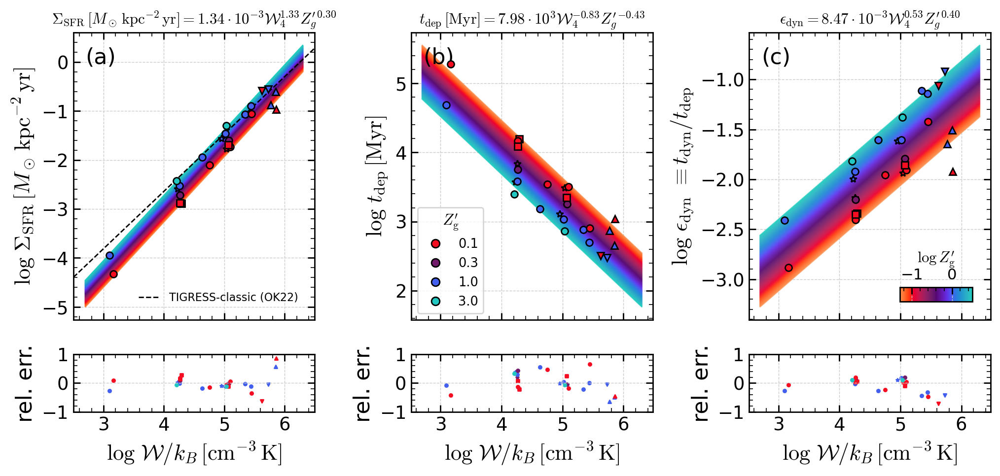

In [52]:
fig, axes_ = plt.subplots(
    2,
    3,
    sharex="col",
    figsize=(12, 5),
    gridspec_kw=dict(height_ratios=[1, 0.2], wspace=0.4, hspace=0.2),
)

# set field names for x-axes
x1, x2 = ["W", "Zgas"]
for yf, axes in zip(["sfr", "tdep", "edyn"], axes_.T):
    odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # plot results
    plt.sca(axes[0])
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, yf,
                      legend=3 if yf == "tdep" else 0,
                      colorbar=4 if yf == "edyn" else 0)
    # plt.ylim(2., 6.0)
    # plt.xlim(0.5, 2.0)

    # write fitting result as the axis title
    a = odr_out.beta[1]
    b = odr_out.beta[2]
    Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
    tit = (
        labels[yf]
        + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
    )
    plt.title(tit, fontsize="x-small")
    if yf == "edyn":
        plt.ylabel(f"$\\log\,${labels[yf]} $\\equiv t_{{\\rm dyn}}/t_{{\\rm dep}}$")
    plt.sca(axes[1])
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, yf, residual=True)

    axes[0].set_xlabel("")

    # add reference line from the previous result (Ostriker & Kim 2022 Eq 27, Figure 14)
    if yf == "sfr":
        plt.sca(axes[0])
        plt.plot(Wref, 1.17 * Wref - 7.32, **ref_kwargs)
        plt.xlim(Wref_min, Wref_max)
        # leg1 = plt.gca().get_legend()
        custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
        leg2 = plt.legend(
            custom_lines2,
            ["TIGRESS-classic (OK22)"],
            loc=4,
            borderpad=1,
            fontsize=8,
            frameon=False,
        )

# decorate figure
fig.axes[-1].xaxis.set_ticks_position("top")
fig.axes[-1].xaxis.set_label_position("top")
plt.setp(fig.axes[-1].get_xticklabels(), "fontsize", "x-small")
fig.axes[-1].set_xlabel(fig.axes[-1].get_xlabel(), fontsize="x-small")

# add panel label (a), (b), ...
add_panel_labels(axes_[0, :])
plt.savefig(os.path.join(outdir, "sfr_time_W.png"), bbox_inches=None)

Beta: [-8.19897368  1.3313466   0.30117841]
Beta Std Error: [0.19022054 0.03861682 0.053249  ]
Beta Covariance: [[ 4.83332298 -0.96289051  0.24926843]
 [-0.96289051  0.19919753 -0.01639328]
 [ 0.24926843 -0.01639328  0.37875117]]
Residual Variance: 0.007486330475950585
Inverse Condition #: 0.003304831912472553
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.22091822781118992
L2 : 0.3589250913933103
Beta: [ 7.23979523 -0.83442374 -0.43209225]
Beta Std Error: [0.24423278 0.04961842 0.06846647]
Beta Covariance: [[ 3.18445219 -0.63486574  0.15959787]
 [-0.63486574  0.1314355  -0.00976782]
 [ 0.15959787 -0.00976782  0.25025495]]
Residual Variance: 0.0187315266021954
Inverse Condition #: 0.0033074060242867798
Reason(s) for Halting:
  Sum of squares convergence
L1 : 0.31602649490559864
L2 : 0.4911062733444835


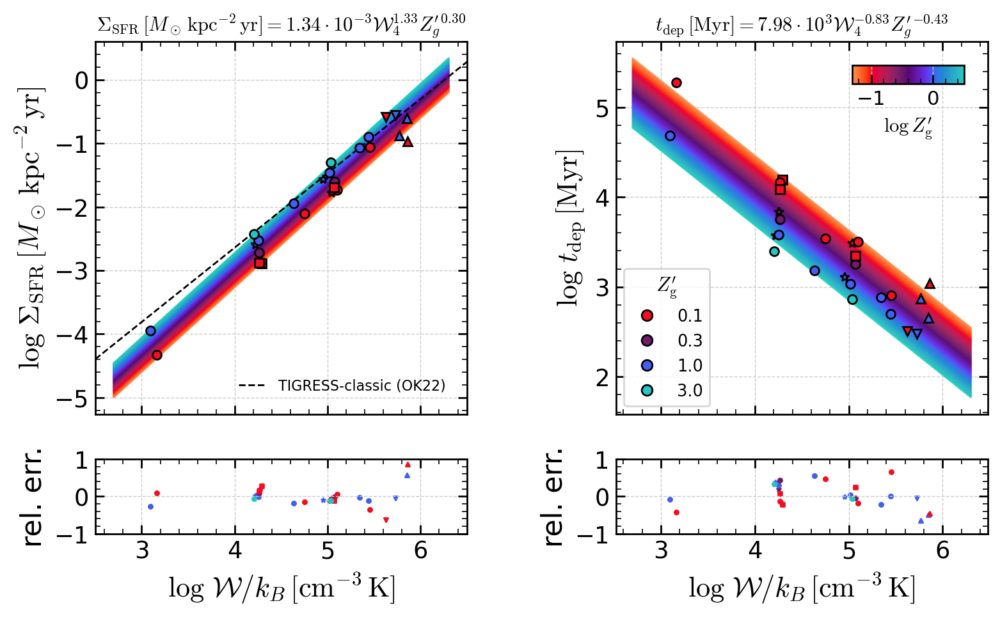

In [20]:
fig, axes_ = plt.subplots(
    2,
    2,
    sharex="col",
    figsize=(9, 5),
    gridspec_kw=dict(height_ratios=[1, 0.2], wspace=0.4, hspace=0.2),
)

# set field names for x-axes
x1, x2 = ["W", "Zgas"]
for yf, axes in zip(["sfr", "tdep"], axes_.T):
    odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
    # construct model (not the x1-axis is not W and the parameter range is changed)
    model_dset = get_model_odr(
        odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=Wmin, Wmax=Wmax, dims=[x2, x1]
    )

    # plot results
    plt.sca(axes[0])
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, yf,
                      legend=3 if yf == "tdep" else 0,
                      colorbar=1 if yf == "tdep" else 0)
    # plt.ylim(2., 6.0)
    # plt.xlim(0.5, 2.0)

    # write fitting result as the axis title
    a = odr_out.beta[1]
    b = odr_out.beta[2]
    Y0 = 10 ** odr_out.beta[0] * 1.0e4**a
    tit = (
        labels[yf]
        + f"$={scifmt(Y0)} \\mathcal{{W}}_4^{{{a:5.2f}}}{{Z_g^\\prime}}^{{{b:5.2f}}}$"
    )
    plt.title(tit, fontsize="x-small")
    if yf == "edyn":
        plt.ylabel(f"$\\log\,${labels[yf]} $\\equiv t_{{\\rm dyn}}/t_{{\\rm dep}}$")

    axes[0].set_xlabel("")

    plt.sca(axes[1])
    plot_fitting_mean(qdset_.to_array(), model_dset, x1, yf, residual=True)

    # add reference line from the previous result (Ostriker & Kim 2022 Eq 27, Figure 14)
    if yf == "sfr":
        plt.sca(axes[0])
        plt.plot(Wref, 1.17 * Wref - 7.32, **ref_kwargs)
        plt.xlim(Wref_min, Wref_max)
        # leg1 = plt.gca().get_legend()
        custom_lines2 = [Line2D([0], [0], **ref_kwargs)]
        leg2 = plt.legend(
            custom_lines2,
            ["TIGRESS-classic (OK22)"],
            loc=4,
            borderpad=1,
            fontsize=8,
            frameon=False,
        )

# decorate figure
# fig.axes[-1].xaxis.set_ticks_position("top")
# fig.axes[-1].xaxis.set_label_position("top")
plt.setp(fig.axes[-1].get_xticklabels(), "fontsize", "x-small")
fig.axes[-1].set_xlabel(fig.axes[-1].get_xlabel(), fontsize="x-small")

# add panel label (a), (b), ...
# add_panel_labels(axes_[0, :])
plt.savefig(os.path.join(outdir, "sfr_tdep_W.png"), bbox_inches=None)

Beta: [-5.03179032  2.35492733  0.39474627]
Beta Std Error: [0.17824572 0.11981509 0.09329867]
Beta Covariance: [[ 3.22426652 -2.02173604  0.41108381]
 [-2.02173604  1.4568531  -0.0094687 ]
 [ 0.41108381 -0.0094687   0.88337197]]
Residual Variance: 0.0098538800638179
Inverse Condition #: 0.019361061772998935
Reason(s) for Halting:
  Sum of squares convergence


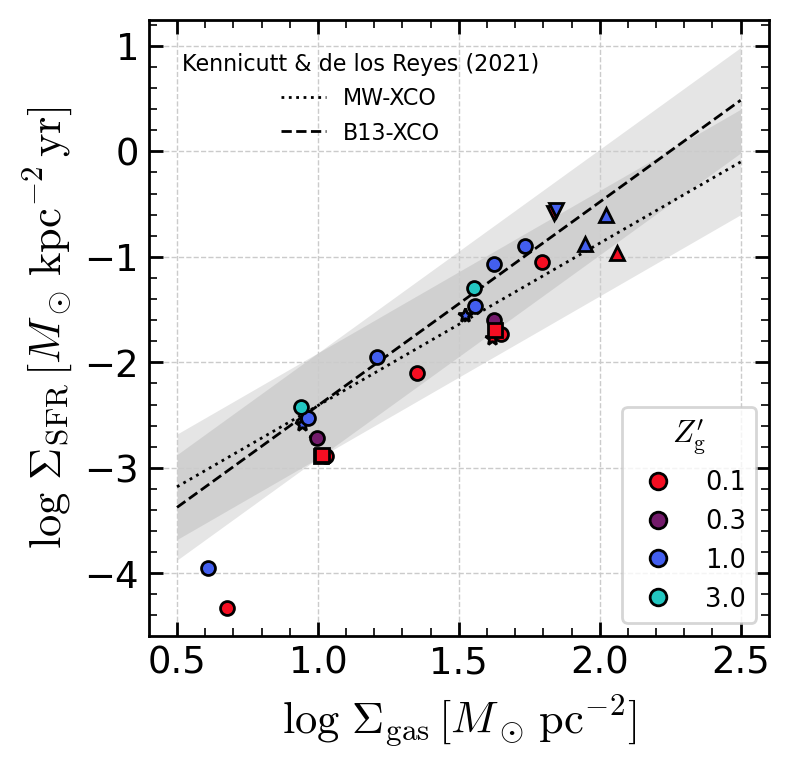

In [27]:
# Figure for weight and Ptot showing off parameter coverage
fig, ax = plt.subplots(1, 1, figsize=(4, 4))

# set field names for x-axes and yaxis
# here we fit Ptot as a function of nH and Zgas
x1, x2, yf = ["Sigma_gas", "Zgas", "sfr"]

# linear regression
odr_out = fit_odr(qdset_.to_array(), xf1=x1, xf2=x2, yf=yf)
# construct model (not the x1-axis is not W and the parameter range is changed)
model_dset = get_model_odr(
    odr_out, Zmin=Zmin, Zmax=Zmax, Wmin=0.5, Wmax=2.5, dims=[x2, x1]
)

# plot simulation data along with fitting result
plt.sca(ax)
# call plotting script
plot_fitting_mean(qdset_.to_array(), model_dset, x1, yf, model=False, legend=4)
# plot_fitting_points(qdset,model_dset,x1,yf,legend=4,colorbar=0,model=False)
# plot all data as grey dots
# plt.plot(pt_df[x1],pt_df[yf],'.',color='grey',alpha=0.1,mew=0,zorder=-1)
Sigma = 10.0**model_dset.Sigma_gas.data
KS_sfr1 = Sigma**1.54 * 10 ** (-3.95)
KS_sfr2 = Sigma**1.93 * 10 ** (-4.34)
plt.plot(np.log10(Sigma), np.log10(KS_sfr1), ls=":", color="k", lw=1)
plt.fill_between(
    np.log10(Sigma),
    np.log10(KS_sfr1) - 0.5,
    np.log10(KS_sfr1) + 0.5,
    color="gray",
    alpha=0.2,
    lw=0,
)
plt.plot(np.log10(Sigma), np.log10(KS_sfr2), ls="--", color="k", lw=1)
plt.fill_between(
    np.log10(Sigma),
    np.log10(KS_sfr2) - 0.5,
    np.log10(KS_sfr2) + 0.5,
    color="gray",
    alpha=0.2,
    lw=0,
)

leg1=plt.gca().get_legend()
custom_lines2 = [
    Line2D([0], [0], ls=":", color="k", lw=1),
    Line2D([0], [0], ls="--", color="k", lw=1),
]
leg2 = plt.legend(
    custom_lines2,
    ["MW-XCO", "B13-XCO"],
    title="Kennicutt & de los Reyes (2021)",
    title_fontsize=8,
    loc=2,
    borderpad=1,
    fontsize=8,
    frameon=False,
)
plt.gca().add_artist(leg1)
# # decorate axis
# fig.axes[-1].xaxis.set_ticks_position('top')
# fig.axes[-1].xaxis.set_label_position('top')
# plt.setp(fig.axes[-1].get_xticklabels(),'fontsize','x-small')
# fig.axes[-1].set_xlabel(fig.axes[-1].get_xlabel(),fontsize='x-small')

# save figure
plt.savefig(os.path.join(outdir, "KS.png"), bbox_inches="tight", dpi=300)